# **Lab: Fluid-structure interaction**
**Gustav Grevsten**

# **Abstract**

In this report, the FEniCS Python library was used in order to implement a finite element solution to the Navier-Stokes equations in 2D using the ALE-method. A mesh with a cylinder was created and this cylinder was then moved up and down the grid to observe the deformation as well as the changes in drag and lift forces. A simulation where the cylinder was kept in place, but still deformed, was also ran.

# **About the code and report**

Most of the code as well as the introduction were provided courtesy of Prof. Johan Hoffman (jhoffman@kth.se) as a part of the course DD2365, Advanced Computation in Fluid Mechanics, at KTH Royal Institute of Technology, Stockholm, Sweden.

# **Set up environment**

In [1]:
# Load neccessary modules.
from google.colab import files

import numpy as np
import time

# Install FEniCS (this may take a long time)
try:
    import dolfin
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenics-install.sh" -O "/tmp/fenics-install.sh" && bash "/tmp/fenics-install.sh"
    import dolfin
    
from dolfin import *; from mshr import *

import dolfin.common.plotting as fenicsplot

from matplotlib import pyplot as plt

import logging
logging.getLogger('FFC').setLevel(logging.WARNING)

--2023-04-19 19:14:30--  https://fem-on-colab.github.io/releases/fenics-install.sh
Resolving fem-on-colab.github.io (fem-on-colab.github.io)... 185.199.110.153, 185.199.108.153, 185.199.109.153, ...
Connecting to fem-on-colab.github.io (fem-on-colab.github.io)|185.199.110.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4156 (4.1K) [application/x-sh]
Saving to: ‘/tmp/fenics-install.sh’

/tmp/fenics-install 100%[===================>]   4.06K  --.-KB/s    in 0s      

2023-04-19 19:14:30 (38.4 MB/s) - ‘/tmp/fenics-install.sh’ saved [4156/4156]

+ INSTALL_PREFIX=/usr/local
++ awk -F/ '{print NF-1}'
++ echo /usr/local
+ INSTALL_PREFIX_DEPTH=2
+ PROJECT_NAME=fem-on-colab
+ SHARE_PREFIX=/usr/local/share/fem-on-colab
+ FENICS_INSTALLED=/usr/local/share/fem-on-colab/fenics.installed
+ [[ ! -f /usr/local/share/fem-on-colab/fenics.installed ]]
+ PYBIND11_INSTALL_SCRIPT_PATH=https://github.com/fem-on-colab/fem-on-colab.github.io/raw/bef019f/releases/pybind11-install.s

# **Introduction**

The Navier-Stokes equations take the form

$\dot u + (u\cdot \nabla)u + \nabla p -\Delta u = f,\quad \nabla \cdot u=0,$

together with suitable initial and boundary conditions.

Here we present a FEniCS implementation of a stabilized space-time Arbitrary Lagrangian-Eulerian (ALE) finite element method to solve the Navier-Stokes equations in 2D. The solution is visualized using FEniCS plotting functions.

We seek a finite element approximation $(u,p)\in V\times Q$ such that 

$(\dot u + ((u-m)\cdot \nabla)u, v) - (p,\nabla \cdot v) + (\nu \nabla u,\nabla v) + (\nabla \cdot u, q) + SD(u,p;v,q) = (f,v),$

for all test functions $(v,q) \in \hat V\times \hat Q$, where $SD(u,p;v,q)$ is a residual based stabilization term. The mesh velocity is denoted by m. 

We present an example of flow past a circular cylinder, for which we compute the force on the surface of the cylinder $\Gamma$ in the direction $\phi$, by Green's formula: 

$
F(u,p,\phi)= ~<\nu \nabla u\cdot n-pn, \Phi>_{\Gamma} ~=~(\dot u+(u\cdot \nabla)u, \Phi) + (\nu \nabla u,\nabla \Phi) - (p,\nabla \cdot\Phi)-(f,\Phi),
$

with $\Phi\in V$ a fuinction for which $\Phi\vert _{\Gamma}=\phi$ and $\Phi\vert_{\partial \Omega \setminus \Gamma}=0$. With $\phi=(1,0)$ we get the drag force $F_D$, and with $\phi=(0,1)$ the lift force $F_L$. The drag and lift coefficients are obtained by normalization, 

$
c_D = \frac{2F_D}{\rho U^2D}, \quad c_L = \frac{2F_L}{\rho U^2D}
$

where $\rho$ is the density (here $\rho=1$), $U$ the characteristic velocity (here $U=1$), and $D$ the characteristic length scale (here $D$ is the diameter of the cylinder). 

The Reynolds number is defined as $Re=\frac{UD}{\nu}$

# **Method**

For this lab, a mesh with a uniform mesh size of $h = \frac{1}{32}$ was used with the dimensions $4 \times 2$. This mesh contained a cylinder with a radius of $r=0.2$.

**Define domain and mesh**

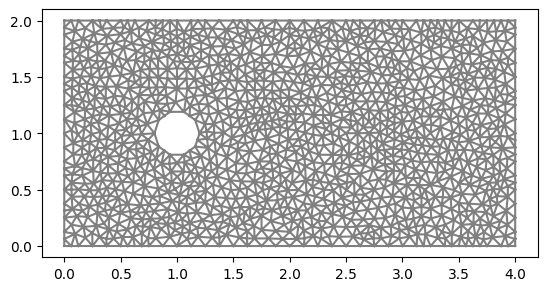

In [3]:
L = 4
H = 2

xc = 1.0
yc = 0.5*H
rc = 0.2

x = 1.0
y = 0.5*H
s = 0.4

def meshfunc(square = False):
  global L, H, xc, yc, rc, x, y, s
  # Define rectangular domain 

  if square:
    # Define square
    x = x
    y = y
    s = s

  else:
    # Define circle
    xc = xc
    yc = yc
    rc = rc

  # Generate mesh (examples with and without a hole in the mesh) 
  resolution = 32

  if square:
    mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Rectangle(Point(x - s/2,y - s/2), Point(x + s/2,y + s/2)), resolution)
  else:
    mesh = generate_mesh(Rectangle(Point(0.0,0.0), Point(L,H)) - Circle(Point(xc,yc),rc), resolution)

  # Local mesh refinement (specified by a cell marker)
  no_levels = 0
  for i in range(0,no_levels):
    cell_marker = MeshFunction("bool", mesh, mesh.topology().dim())
    for cell in cells(mesh):
      cell_marker[cell] = False
      p = cell.midpoint()
      if p.distance(Point(xc, yc)) < 1.0:
          cell_marker[cell] = True
    mesh = refine(mesh, cell_marker)

  return mesh

mesh = meshfunc(False)

plt.figure()
plot(mesh)
plt.show()

**Define finite element approximation spaces and boundary conditions**

In [4]:
def function_space(mesh):
  global L, H, xc, yc, rc, x, y, s

  # Generate finite element spaces (for velocity and pressure)
  V = VectorFunctionSpace(mesh, "Lagrange", 1)
  Q = FunctionSpace(mesh, "Lagrange", 1)

  # Define trial and test functions 
  u = TrialFunction(V)
  p = TrialFunction(Q)
  v = TestFunction(V)
  q = TestFunction(Q)

  # Define subdomains (for boundary conditions)
  class Left(SubDomain):
      def inside(self, x, on_boundary):
          return near(x[0], 0.0) 

  class Right(SubDomain):
      def inside(self, x, on_boundary):
          return near(x[0], L)

  class Lower(SubDomain):
      def inside(self, x, on_boundary):
          return near(x[1], 0.0)

  class Upper(SubDomain):
      def inside(self, x, on_boundary):
          return near(x[1], H)
      
  left = Left()
  right = Right()
  lower = Lower()
  upper = Upper()

  # Define mesh functions (for boundary conditions)
  boundaries = MeshFunction("size_t", mesh, mesh.topology().dim()-1)
  boundaries.set_all(0)
  left.mark(boundaries, 1)
  right.mark(boundaries, 2)
  lower.mark(boundaries, 3)
  upper.mark(boundaries, 4)

  # Define boundary conditions 
  class DirichletBoundaryLower(SubDomain):
      def inside(self, x, on_boundary):
          return on_boundary and near(x[1], 0.0)

  class DirichletBoundaryUpper(SubDomain):
      def inside(self, x, on_boundary):
          return on_boundary and near(x[1], H)

  class DirichletBoundaryLeft(SubDomain):
      def inside(self, x, on_boundary):
          return on_boundary and near(x[0], 0.0) 

  class DirichletBoundaryRight(SubDomain):
      def inside(self, x, on_boundary):
          return on_boundary and near(x[0], L)

  class DirichletBoundaryObjects(SubDomain):
      def inside(self, x, on_boundary):
          return on_boundary and (not near(x[0], 0.0)) and (not near(x[0], L)) and (not near(x[1], 0.0)) and (not near(x[1], H))

  dbc_lower = DirichletBoundaryLower()
  dbc_upper = DirichletBoundaryUpper()
  dbc_left = DirichletBoundaryLeft()
  dbc_right = DirichletBoundaryRight()
  dbc_objects = DirichletBoundaryObjects()

  # Examples of time dependent and stationary inflow conditions
  #uin = Expression('4.0*x[1]*(1-x[1])', element = V.sub(0).ufl_element())
  #uin = Expression('1.0 + 1.0*fabs(sin(t))', element = V.sub(0).ufl_element(), t=0.0)
  uin = 1.0
  bcu_in0 = DirichletBC(V.sub(0), uin, dbc_left)
  bcu_in1 = DirichletBC(V.sub(1), 0.0, dbc_left)
  bcu_upp0 = DirichletBC(V.sub(0), 0.0, dbc_upper)
  bcu_upp1 = DirichletBC(V.sub(1), 0.0, dbc_upper)
  bcu_low0 = DirichletBC(V.sub(0), 0.0, dbc_lower)
  bcu_low1 = DirichletBC(V.sub(1), 0.0, dbc_lower)
  bcu_obj0 = DirichletBC(V.sub(0), 0.0, dbc_objects)
  bcu_obj1 = DirichletBC(V.sub(1), 0.0, dbc_objects)

  pin = Expression('5.0*fabs(sin(t))', element = Q.ufl_element(), t=0.0)
  pout = 0.0
  #bcp0 = DirichletBC(Q, pin, dbc_left) 
  bcp1 = DirichletBC(Q, pout, dbc_right)

  #bcu = [bcu_in0, bcu_in1, bcu_upp0, bcu_upp1, bcu_low0, bcu_low1, bcu_obj0, bcu_obj1]
  bcu = [bcu_in0, bcu_in1, bcu_upp1, bcu_low1, bcu_obj0, bcu_obj1]
  bcp = [bcp1]

  # Define measure for boundary integration  
  ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

  return V, Q, u, p, v, q, bcu, bcp, ds, pin, pout

# **Results**

**Define, solve and plot the variational problems**

In [12]:
def solve_var(mesh, still = False):
  global L, H, xc, yc, rc, x, y, s

  V, Q, u, p, v, q, bcu, bcp, ds, pin, pout = function_space(mesh)

  # Set viscosity
  nu = 4.0e-3

  # Define iteration functions
  # (u0,p0) solution from previous time step
  # (u1,p1) linearized solution at present time step  
  u0 = Function(V)
  u1 = Function(V)
  p0 = Function(Q)
  p1 = Function(Q)

  # Define mesh deformation w, mesh velocity = w/dt
  amp_x = 0.0
  amp_y = 1.0e-2
  freq = 0.1
  t = 0.0
  if still:
    w = Expression(("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L)","amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]*2/H)"), L=L, H=H, t=t, amp_x=amp_x, amp_y=amp_y, freq=freq, element = V.ufl_element())
  else:
    w = Expression(("amp_x*sin(2.0*pi*t*freq)*sin(pi*x[0]/L)","amp_y*sin(2.0*pi*t*freq-0.5*pi)*sin(pi*x[1]/H)"), L=L, H=H, t=t, amp_x=amp_x, amp_y=amp_y, freq=freq, element = V.ufl_element())
  
  # Set parameters for nonlinear and lienar solvers 
  num_nnlin_iter = 5 
  prec = "amg" if has_krylov_solver_preconditioner("amg") else "default" 

  # Time step length 
  dt = 0.5*mesh.hmin()

  # Define variational problem

  # Stabilization parameters
  h = CellDiameter(mesh);
  u_mag = sqrt(dot(u1,u1))
  d1 = 1.0/sqrt((pow(1.0/dt,2.0) + pow(u_mag/h,2.0)))
  d2 = h*u_mag

  # Mean velocities for trapozoidal time stepping
  um = 0.5*(u + u0)
  um1 = 0.5*(u1 + u0)

  # Momentum variational equation on residual form
  Fu = inner((u - u0)/dt + grad(um)*(um1-w/dt), v)*dx - p1*div(v)*dx + nu*inner(grad(um), grad(v))*dx \
      + d1*inner((u - u0)/dt + grad(um)*(um1-w/dt) + grad(p1), grad(v)*(um1-w/dt))*dx + d2*div(um)*div(v)*dx 
  au = lhs(Fu)
  Lu = rhs(Fu)

  # Continuity variational equation on residual form
  Fp = d1*inner((u1 - u0)/dt + grad(um1)*(um1-w/dt) + grad(p), grad(q))*dx + div(um1)*q*dx 
  ap = lhs(Fp)
  Lp = rhs(Fp)

  # Define the direction of the force to be computed
  phi_x_lift = 0.0
  phi_y_lift = 1.0

  phi_x_drag = 1.0
  phi_y_drag = 0.0

  #psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
  psi_expression_drag = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x_drag, phi_y=phi_y_drag, element = V.ufl_element())
  psi_drag = interpolate(psi_expression_drag, V)

  #psi_expression = Expression(("0.0","pow(x[0]-0.5,2.0) + pow(x[1]-1.0,2.0) - pow(0.2,2.0) < 1.e-5 ? 1. : 0."), element = V.ufl_element())
  psi_expression_lift = Expression(("near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_x : 0.","near(pow(x[0]-xc,2.0) + pow(x[1]-yc,2.0) - pow(rc,2.0), 0.0) ? phi_y : 0."), xc=xc, yc=yc, rc=rc, phi_x=phi_x_lift, phi_y=phi_y_lift, element = V.ufl_element())
  psi_lift = interpolate(psi_expression_lift, V)

  Force_drag = inner((u1 - u0)/dt + grad(um1)*um1, psi_drag)*dx - p1*div(psi_drag)*dx + nu*inner(grad(um1), grad(psi_drag))*dx

  Force_lift = inner((u1 - u0)/dt + grad(um1)*um1, psi_lift)*dx - p1*div(psi_lift)*dx + nu*inner(grad(um1), grad(psi_lift))*dx

  #plt.figure()
  #plot(psi, title="weight function psi")

  # Force normalization
  D = 2*rc
  normalization = -2.0/D

  return au, Lu, bcu, u1, u0, ap, Lp, bcp, p1, p0, Force_drag, Force_lift, dt, ds, normalization, num_nnlin_iter, prec, pin, w

In [16]:
def time_step(mesh, still = False):
  global L, H, xc, yc, rc, x, y, s

  au, Lu, bcu, u1, u0, ap, Lp, bcp, p1, p0, Force_drag, Force_lift, dt, ds, normalization, num_nnlin_iter, prec, pin, w = solve_var(mesh, still)

  # Set plot frequency
  plot_time = 0
  plot_freq = 20

  # Force computation data 
  force_array_lift = np.array(0.0)
  force_array_lift = np.delete(force_array_lift, 0)

  force_array_drag = np.array(0.0)
  force_array_drag = np.delete(force_array_drag, 0)
  
  time = np.array(0.0)
  time = np.delete(time, 0)
  start_sample_time = 1.0

  # Time stepping 
  T = 30
  t = dt

  while t < T + DOLFIN_EPS:

      #s = 'Time t = ' + repr(t) 
      #print(s)

      pin.t = t
      #uin.t = t

      w.t = t 
      ALE.move(mesh, w)

      # Solve non-linear problem 
      k = 0
      while k < num_nnlin_iter: 
          
          # Assemble momentum matrix and vector 
          Au = assemble(au)
          bu = assemble(Lu)

          # Compute velocity solution 
          [bc.apply(Au, bu) for bc in bcu]
          [bc.apply(u1.vector()) for bc in bcu]
          solve(Au, u1.vector(), bu, "bicgstab", "default")

          # Assemble continuity matrix and vector
          Ap = assemble(ap) 
          bp = assemble(Lp)

          # Compute pressure solution 
          [bc.apply(Ap, bp) for bc in bcp]
          [bc.apply(p1.vector()) for bc in bcp]
          solve(Ap, p1.vector(), bp, "bicgstab", prec)

          # Compute force
          Fd = assemble(Force_drag)
          Fl = assemble(Force_lift)
          if (t > start_sample_time):
            force_array_drag = np.append(force_array_drag, normalization*Fd)
            force_array_lift = np.append(force_array_lift, normalization*Fl)
            time = np.append(time, t)

          k += 1

      if t > plot_time:     
          
          s = 'Time t = ' + repr(t) 
          print(s)

          # Plot solution
          plt.figure()
          plot(u1, title="Velocity")

          plt.figure()
          plot(p1, title="Pressure")

          plt.figure()
          plot(mesh, title="Mesh")
          
          plot_time += T/plot_freq
          
          plt.show()

          plt.figure()
          plt.title(f"Force-drag")
          plt.plot(time, force_array_drag)
          plt.show()

          plt.figure()
          plt.title(f"Force-lift")
          plt.plot(time, force_array_lift)
          plt.show()

      # Update time step
      u0.assign(u1)
      t += dt

First, we look at how the cylinder gets deformed as it moves up and down the grid along the y-axis.

Time t = 0.03285506167650246


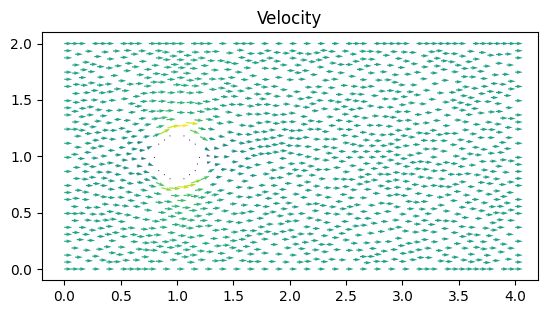

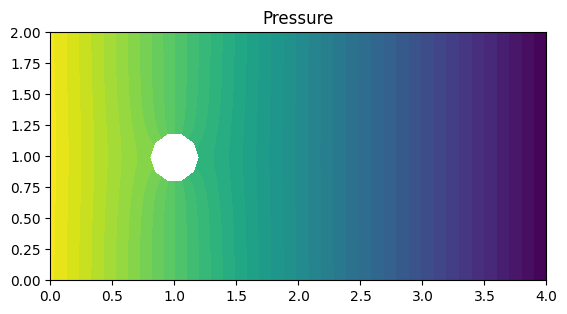

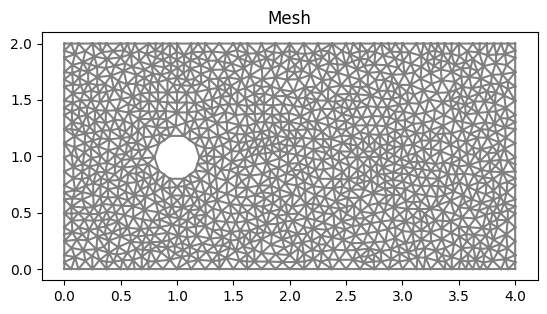

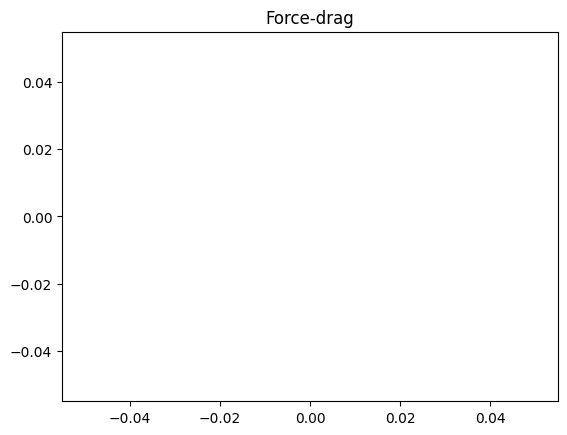

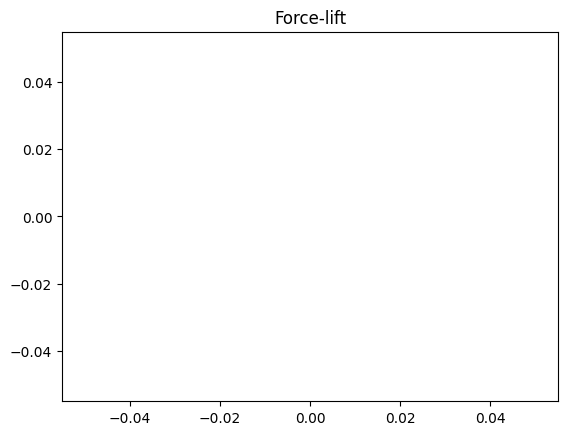

Time t = 1.5113328371191124


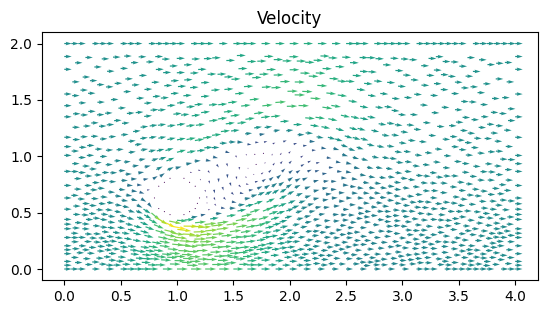

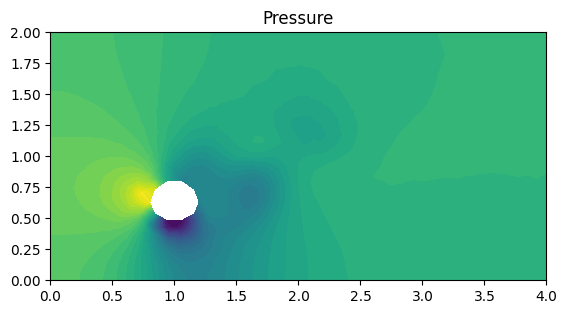

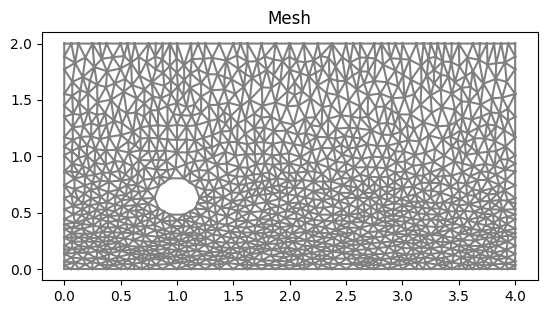

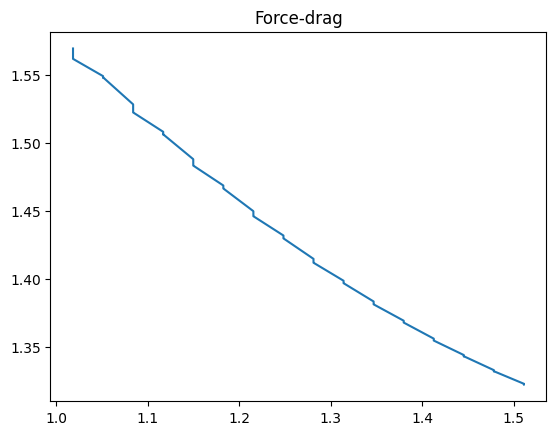

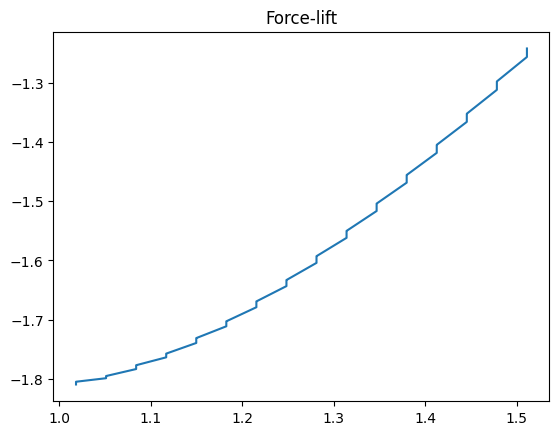

Time t = 3.022665674238231


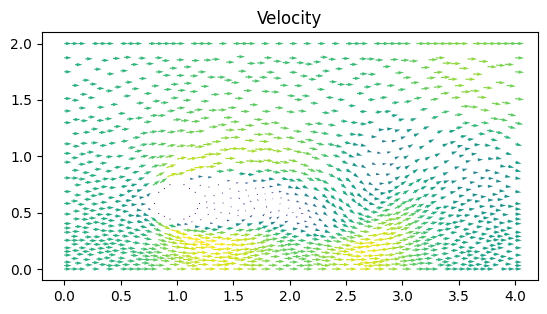

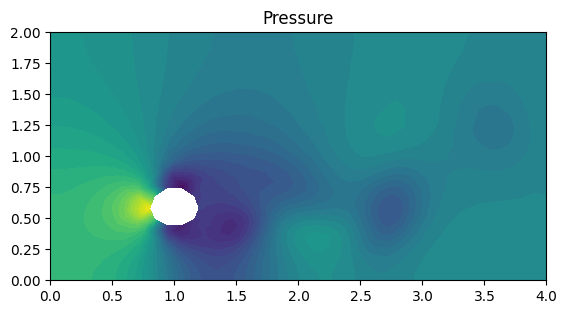

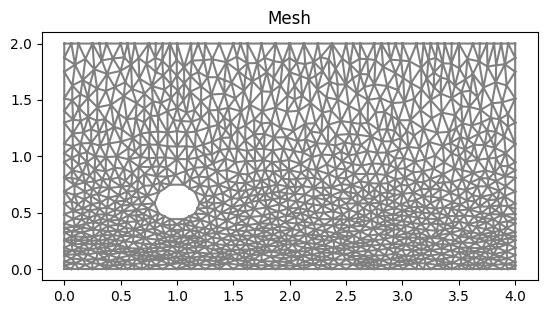

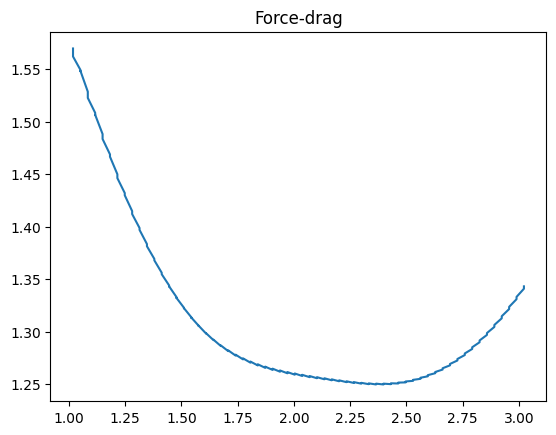

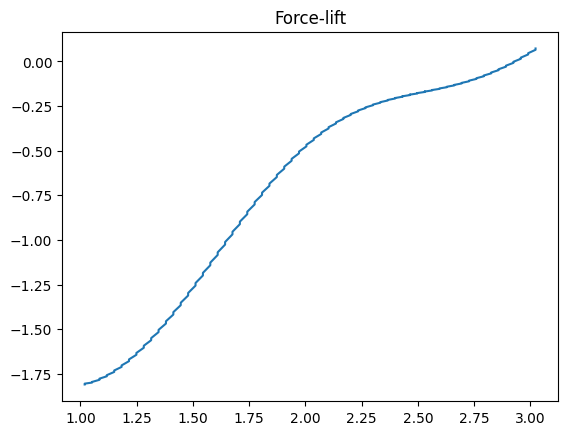

Time t = 4.50114344968085


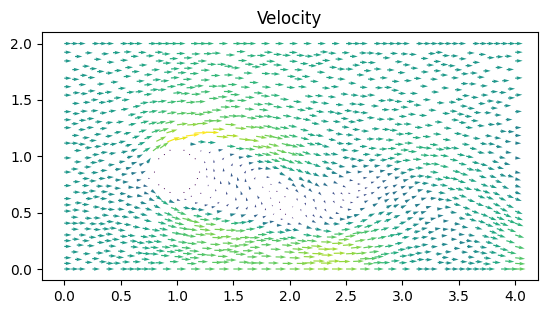

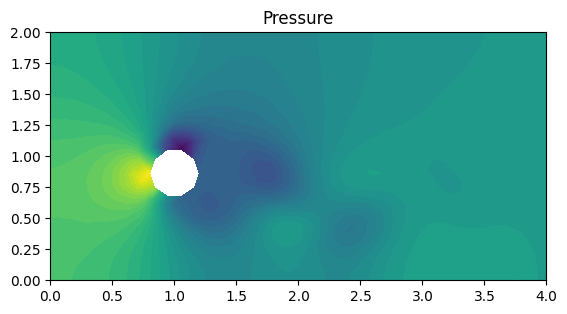

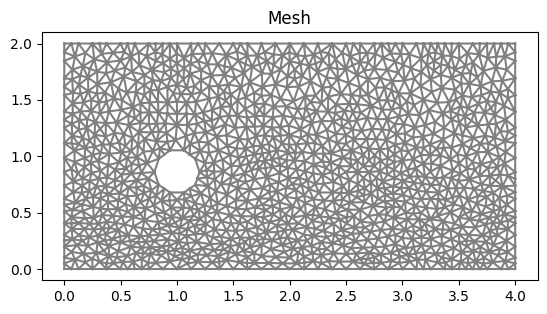

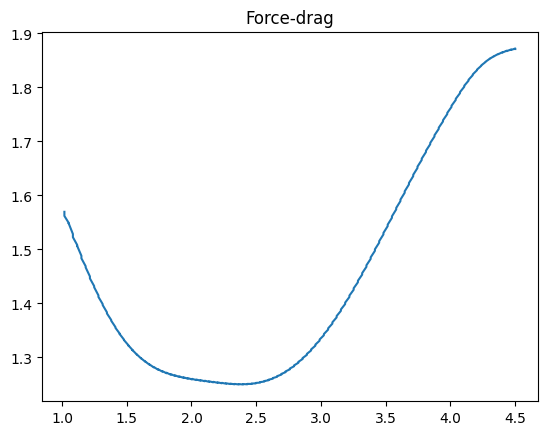

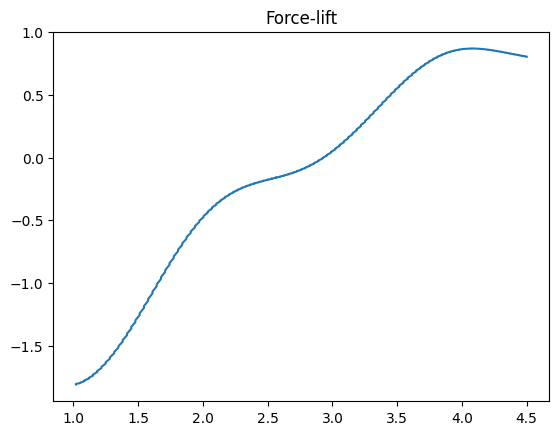

Time t = 6.012476286799972


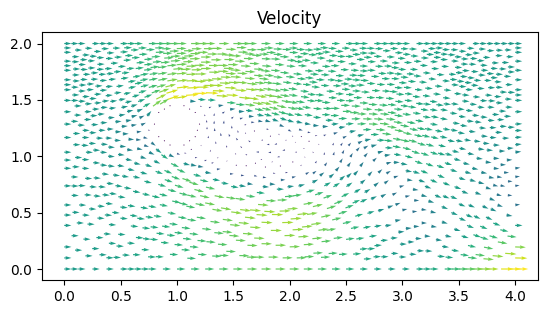

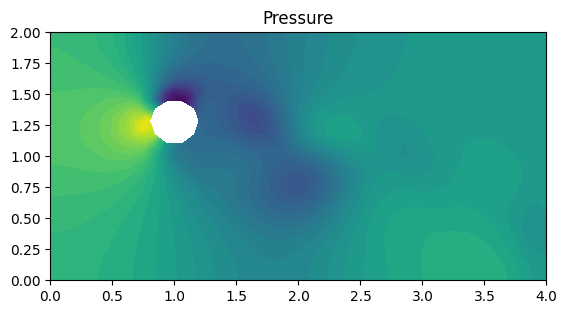

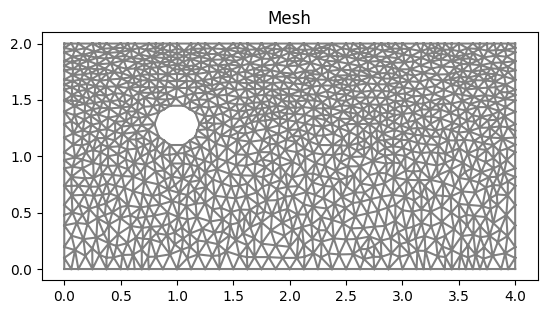

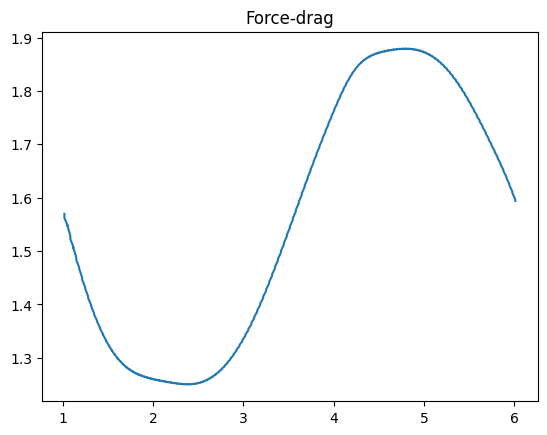

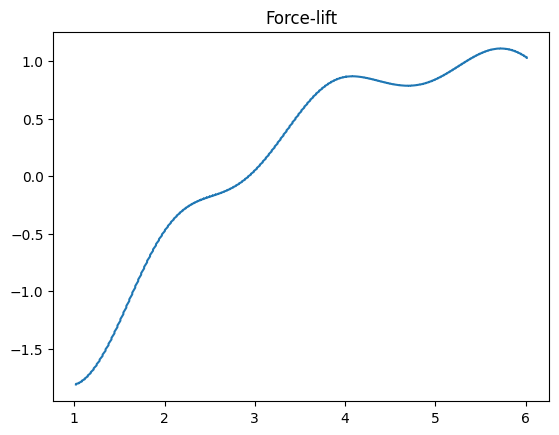

Time t = 7.523809123919094


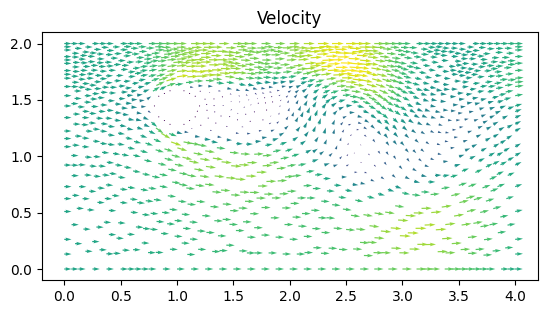

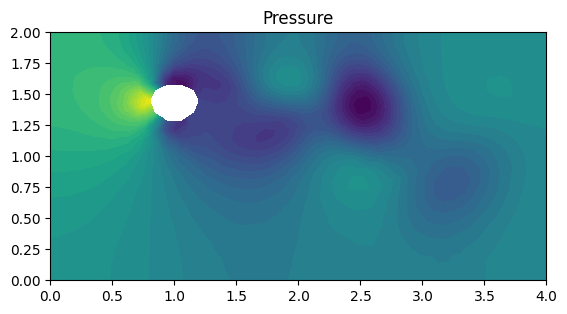

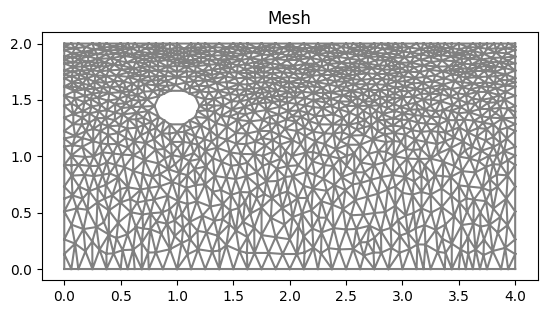

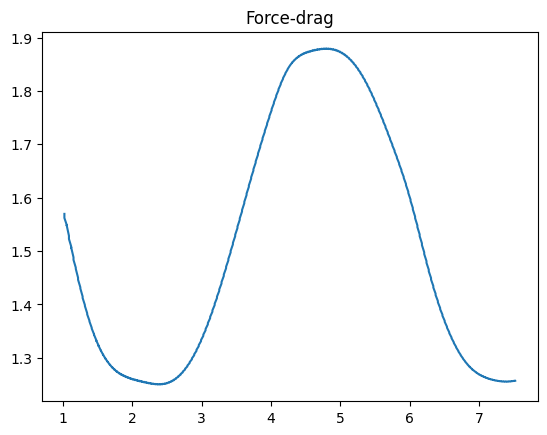

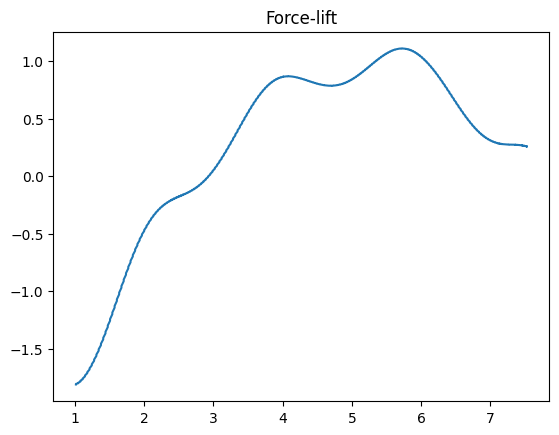

Time t = 9.002286899361685


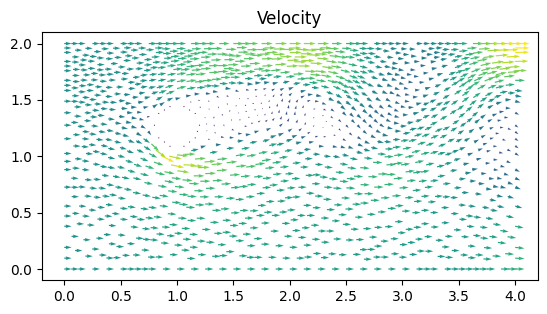

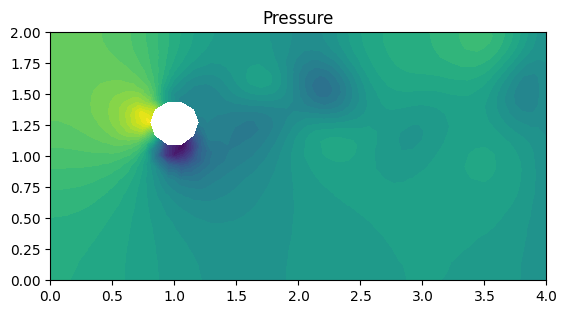

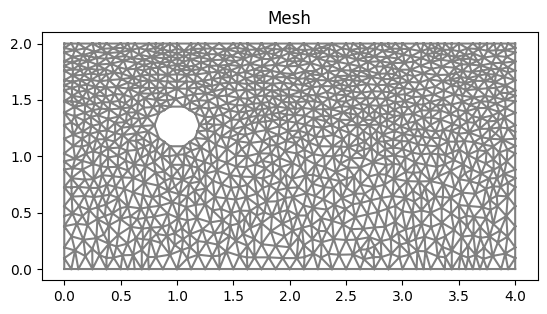

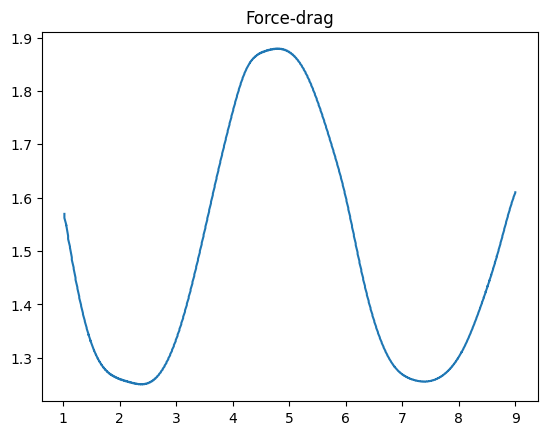

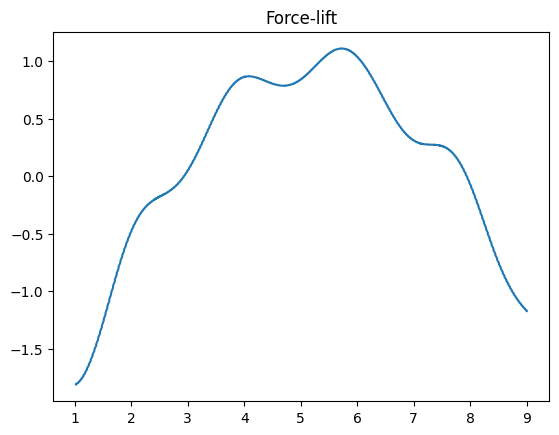

Time t = 10.513619736480766


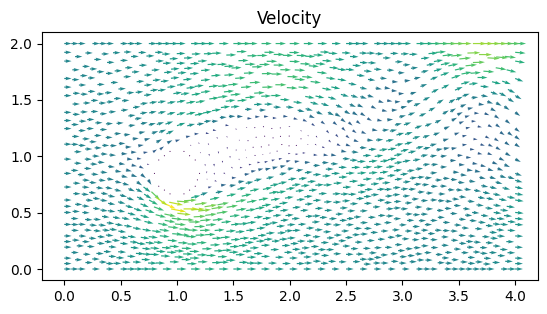

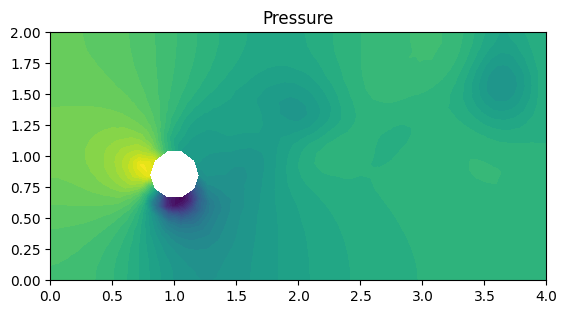

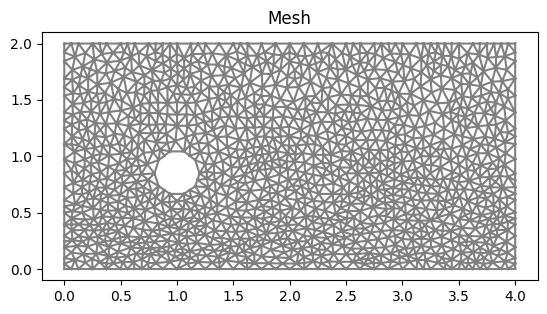

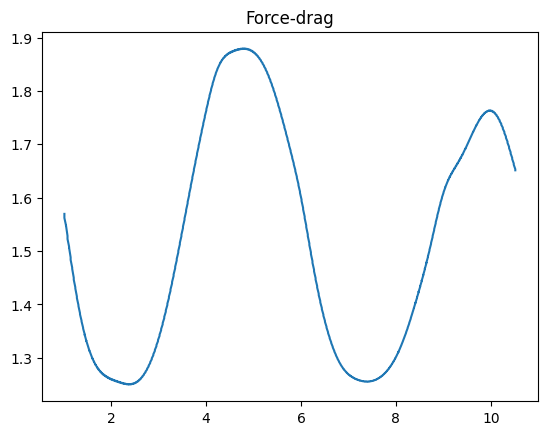

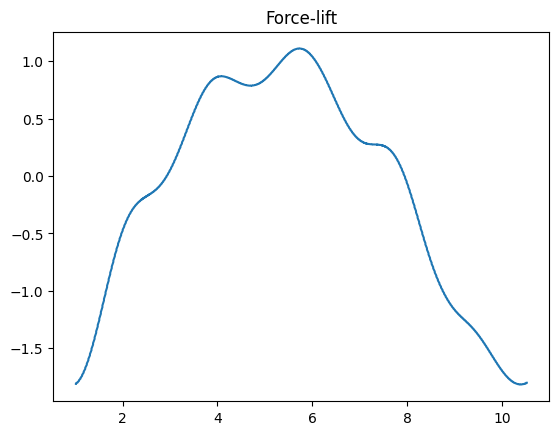

Time t = 12.024952573599847


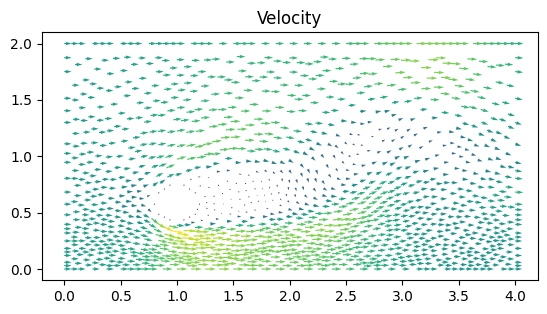

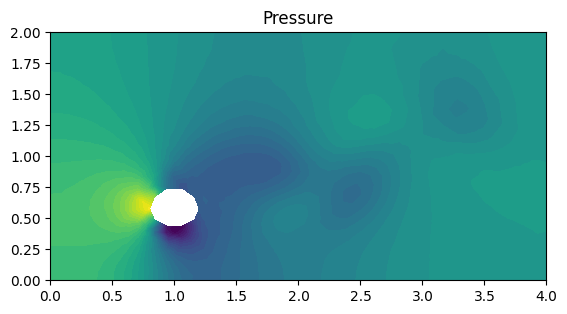

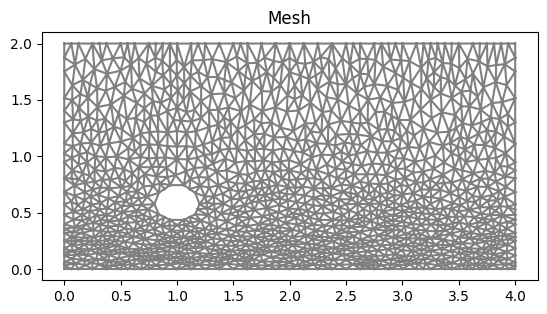

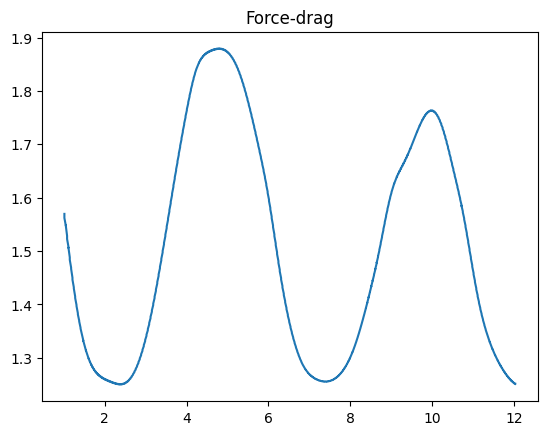

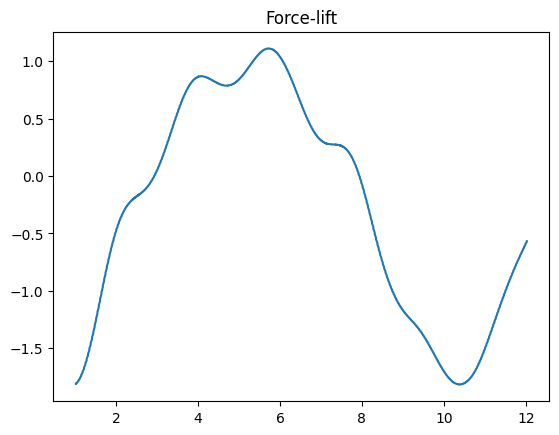

Time t = 13.503430349042427


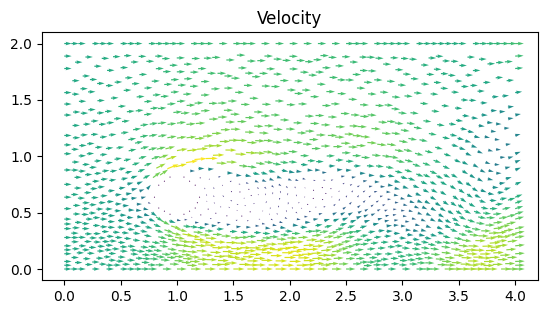

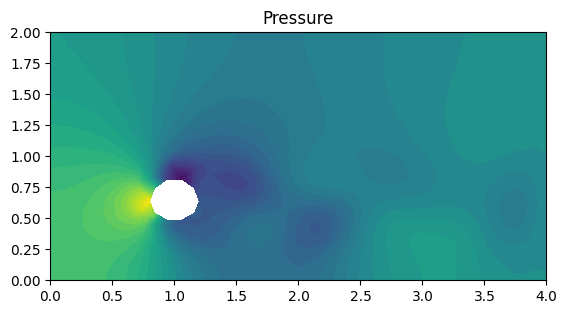

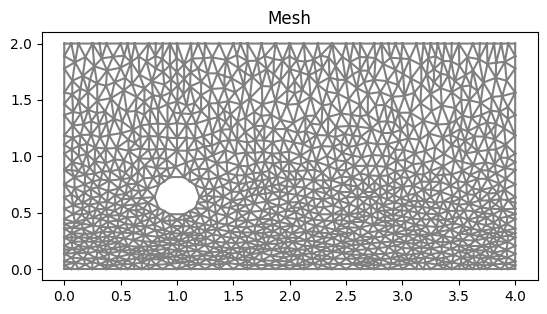

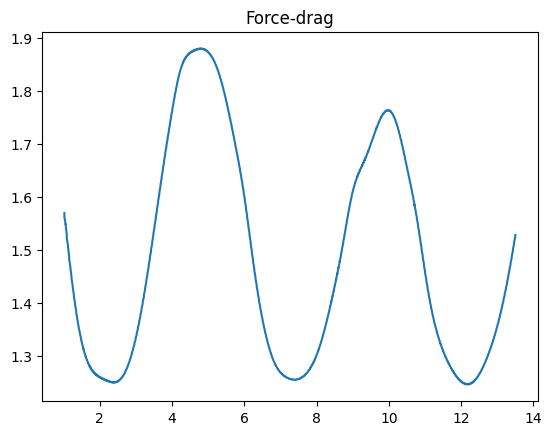

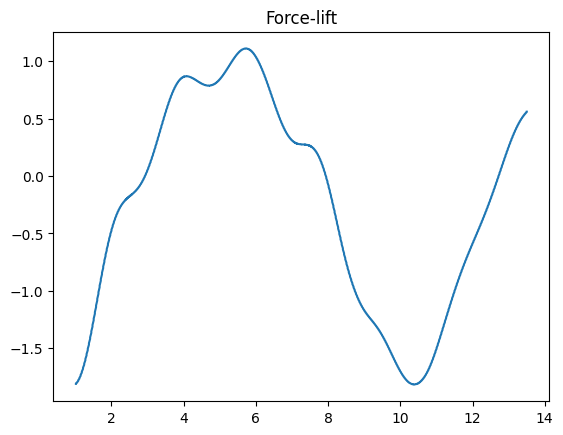

Time t = 15.014763186161508


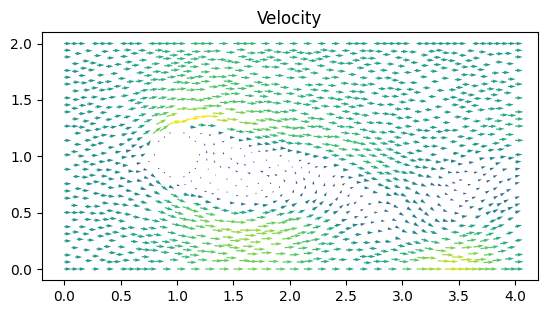

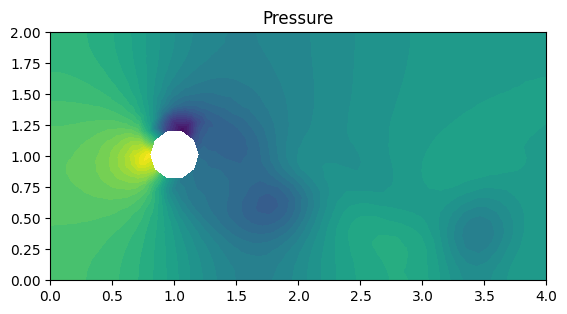

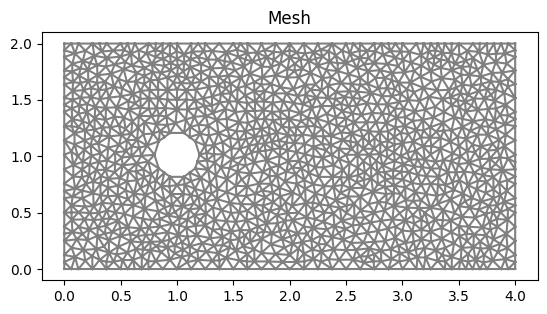

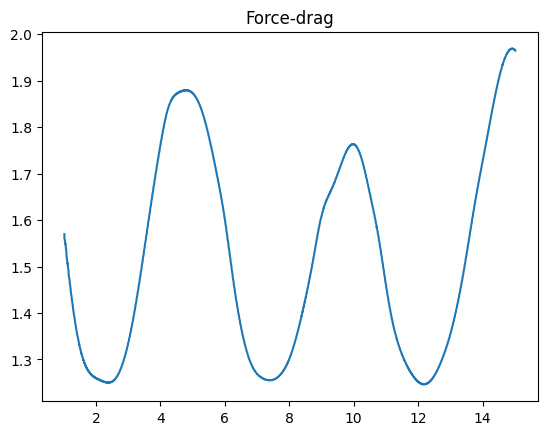

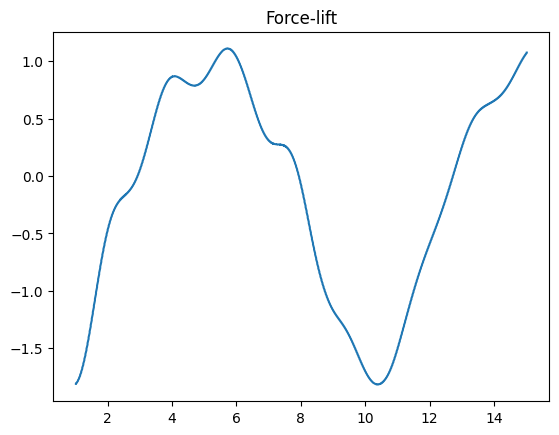

Time t = 16.52609602328062


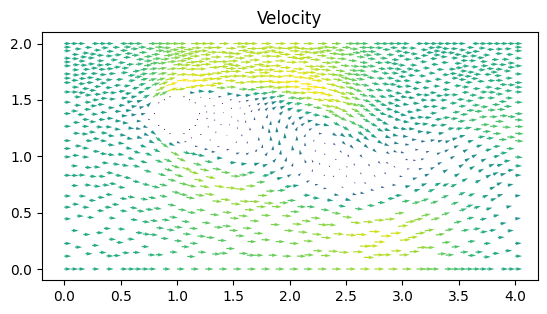

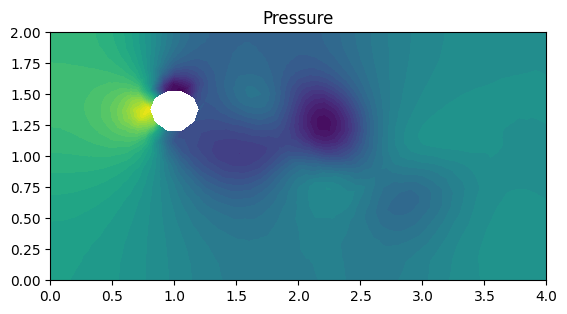

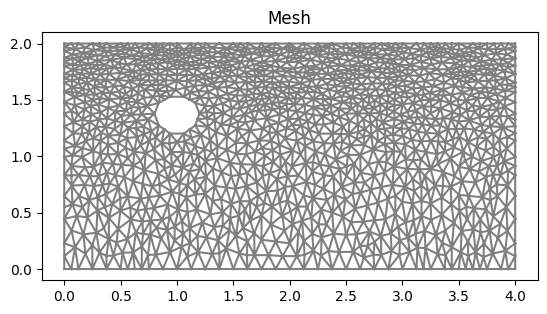

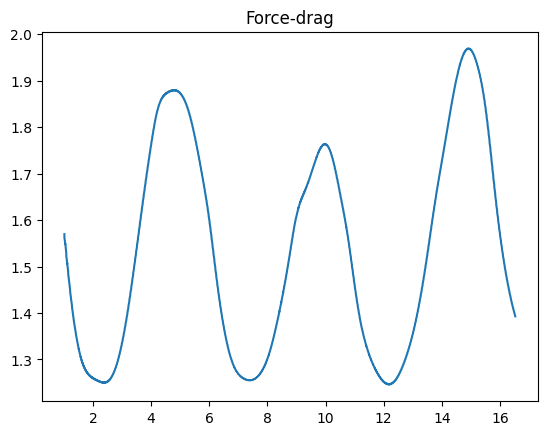

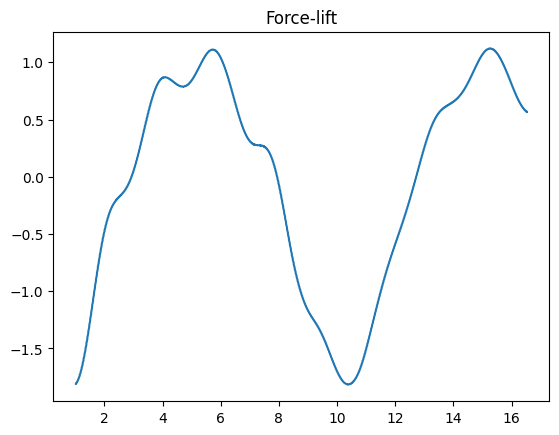

Time t = 18.00457379872328


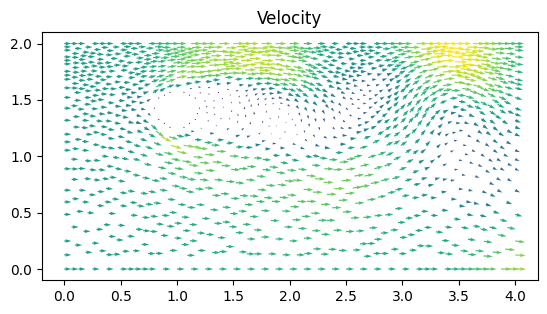

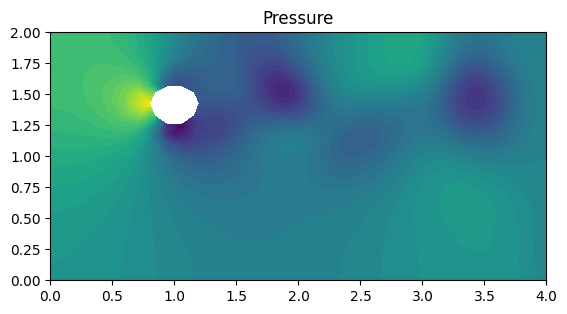

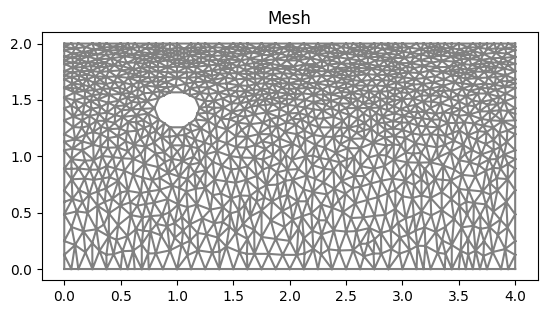

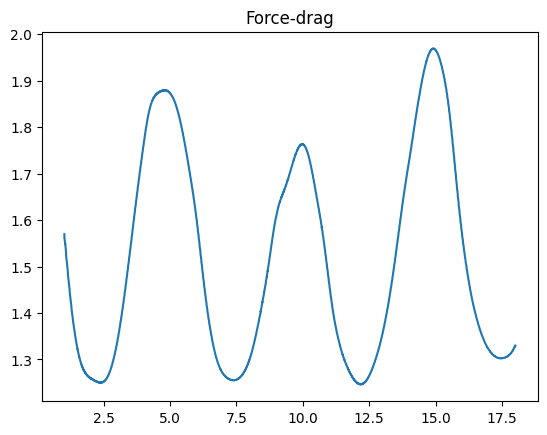

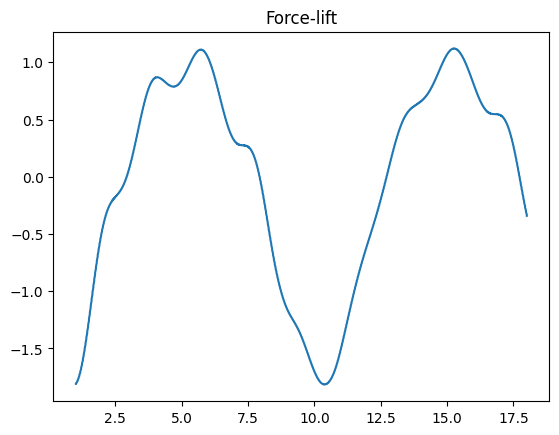

Time t = 19.51590663584244


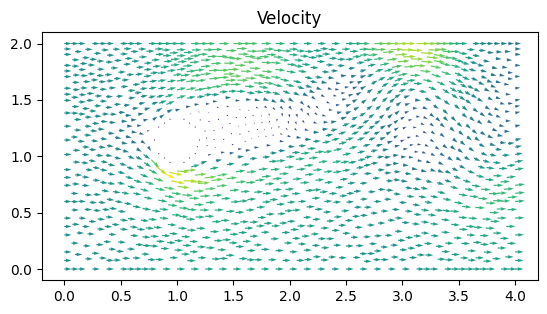

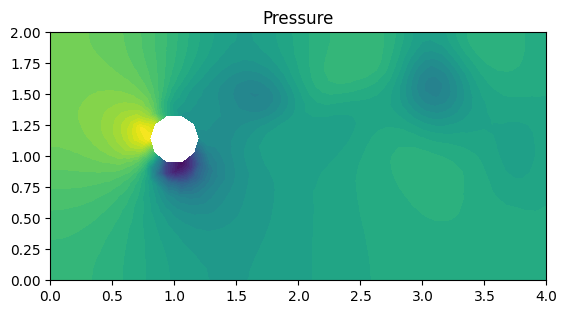

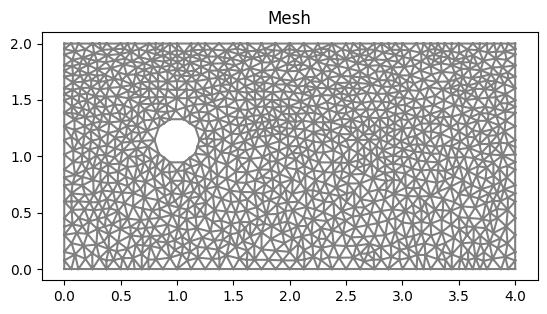

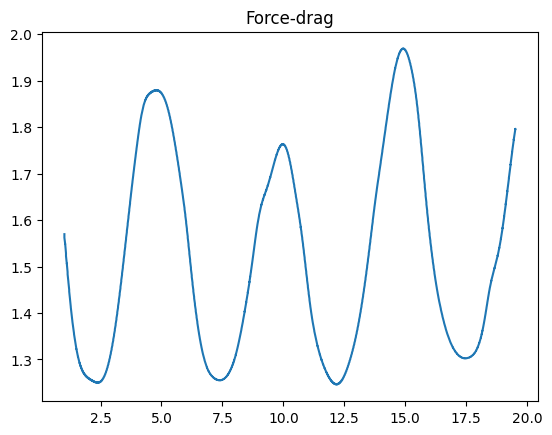

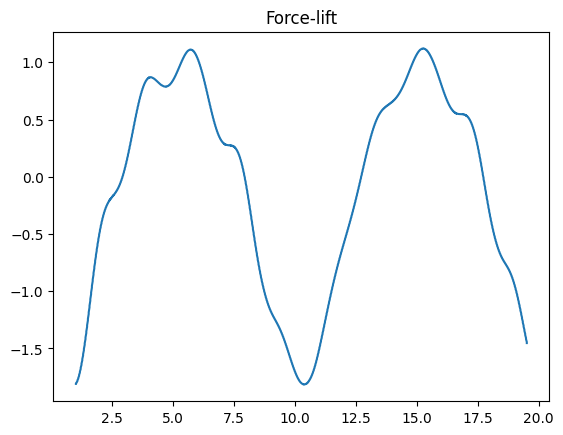

Time t = 21.027239472961604


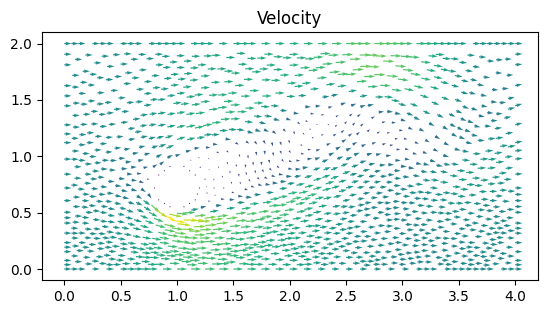

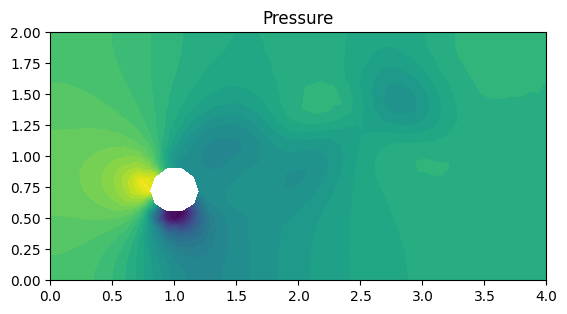

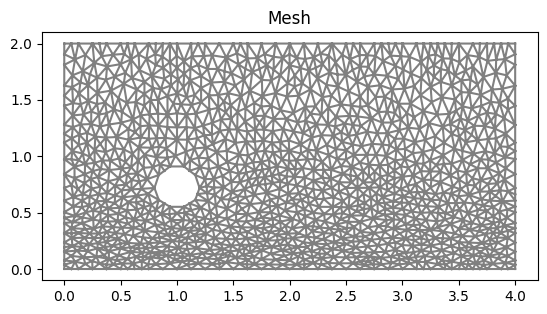

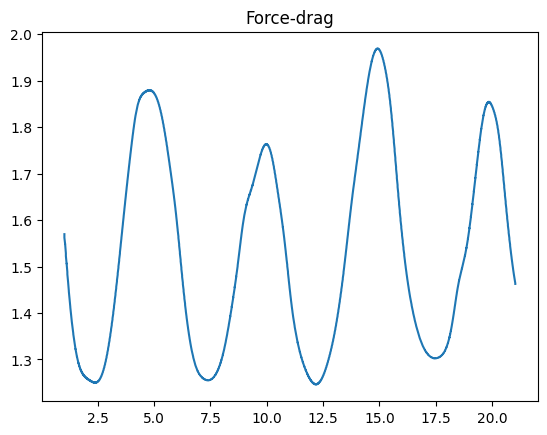

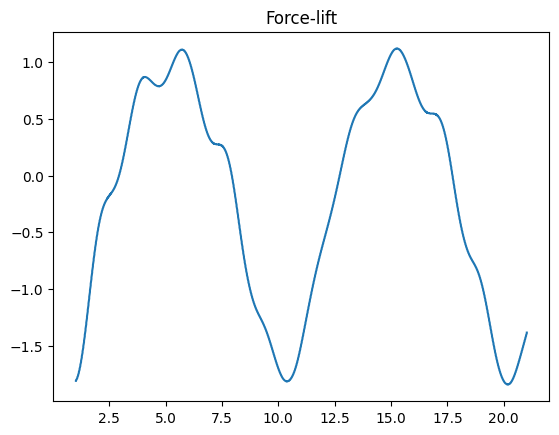

Time t = 22.505717248404263


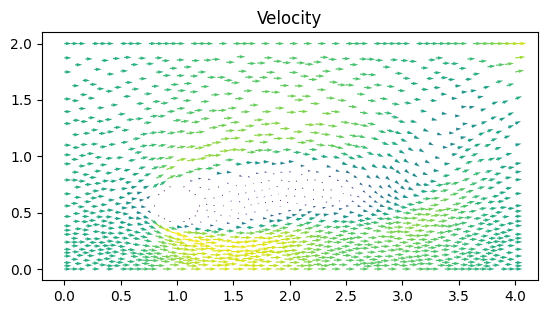

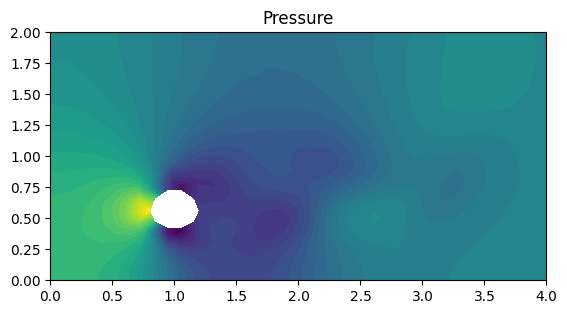

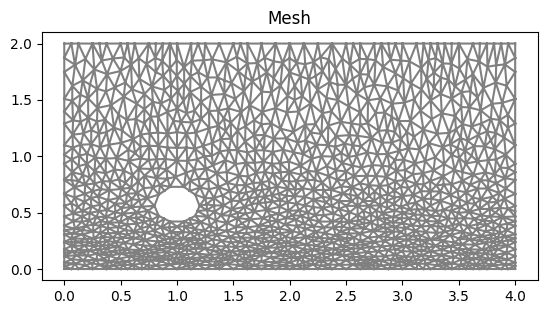

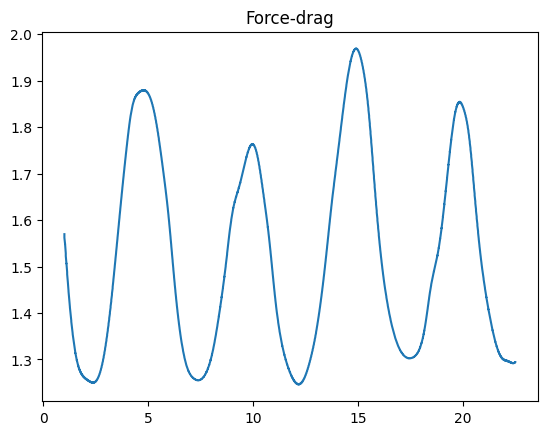

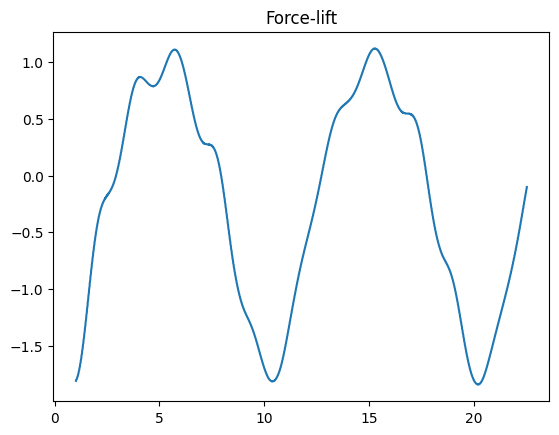

Time t = 24.017050085523426


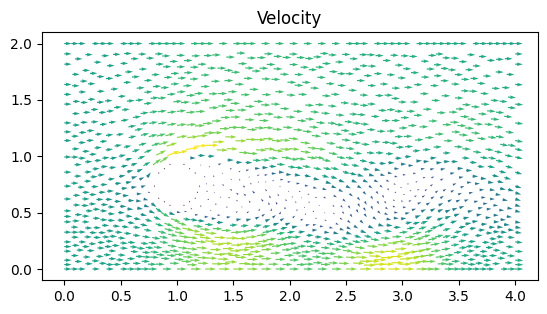

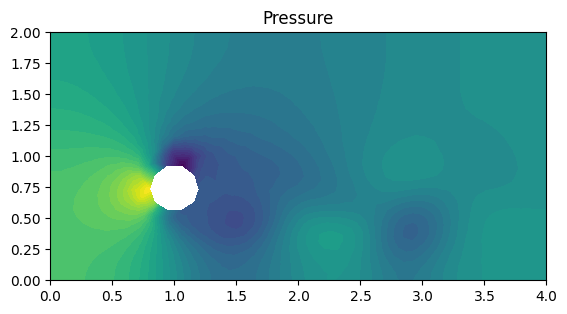

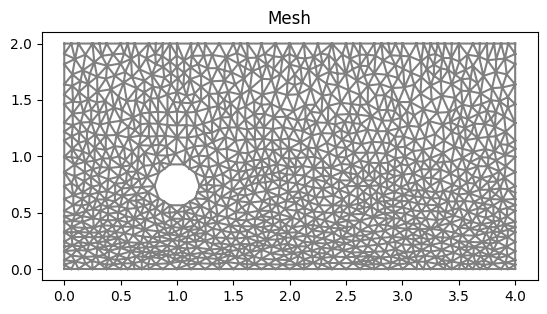

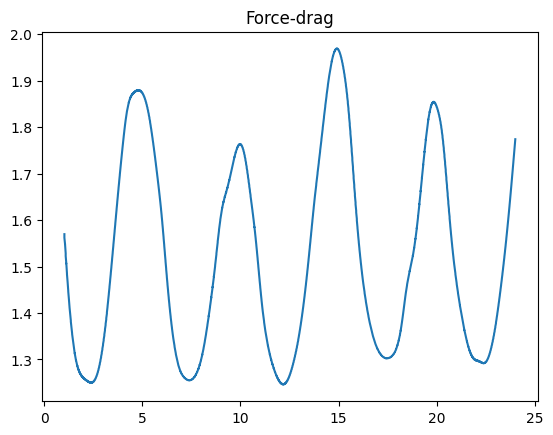

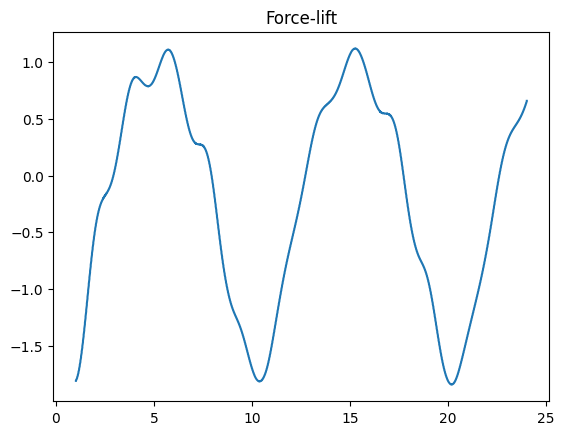

Time t = 25.52838292264259


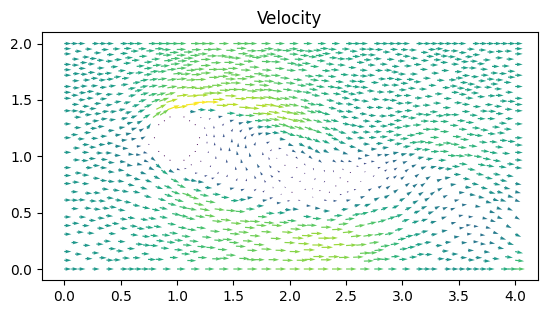

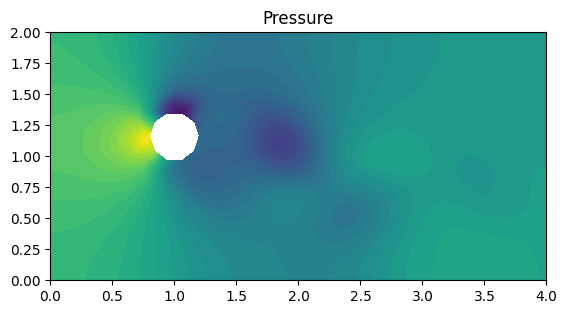

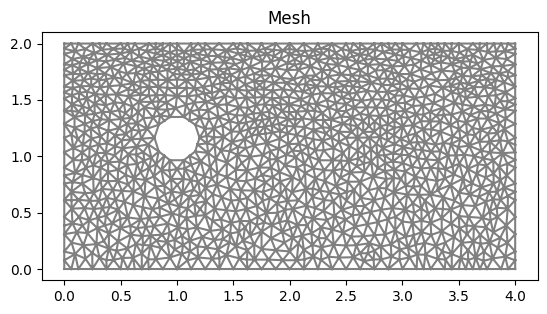

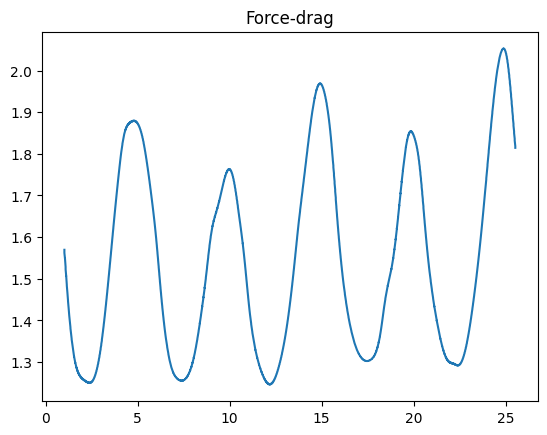

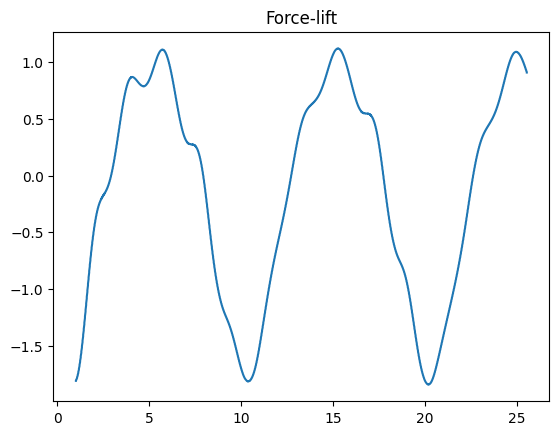

Time t = 27.006860698085248


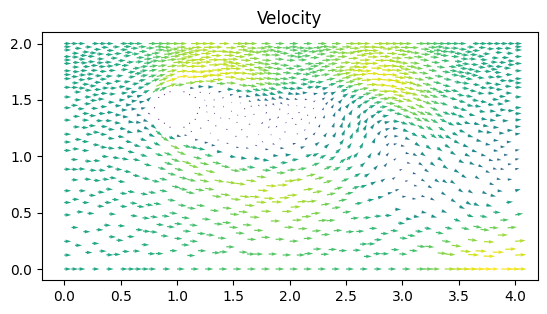

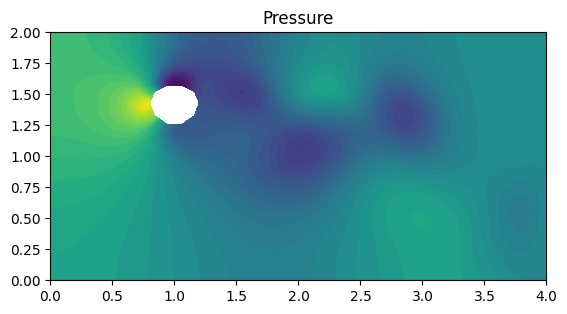

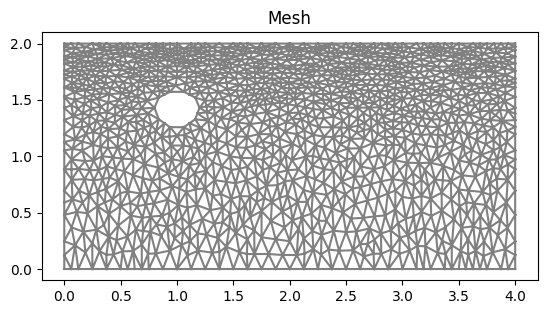

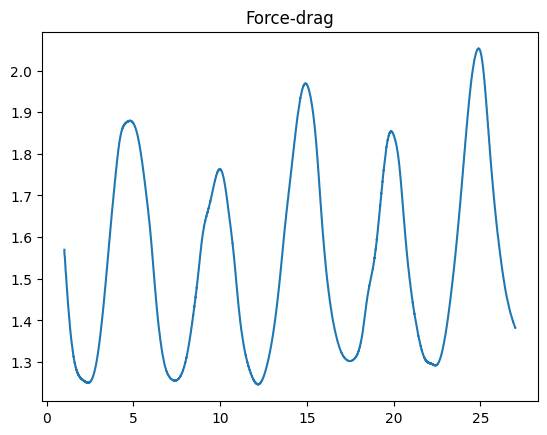

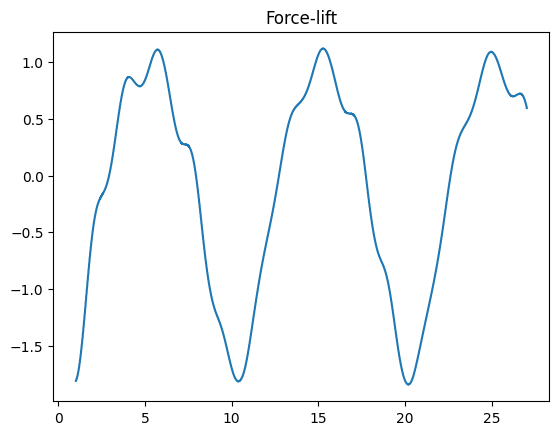

Time t = 28.51819353520441


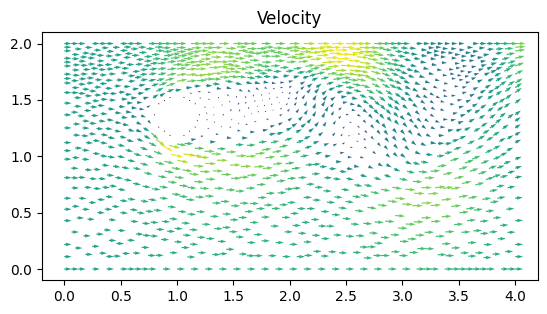

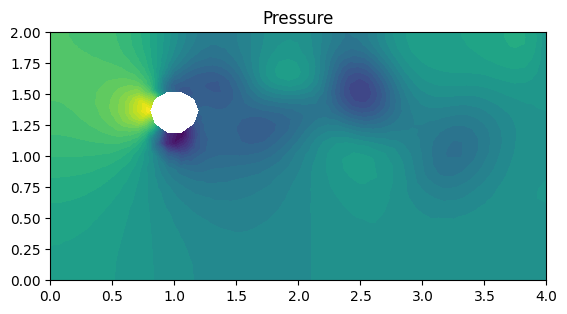

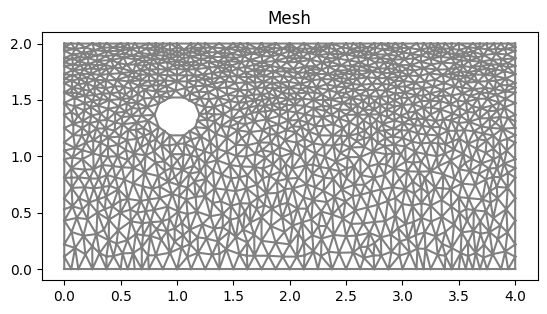

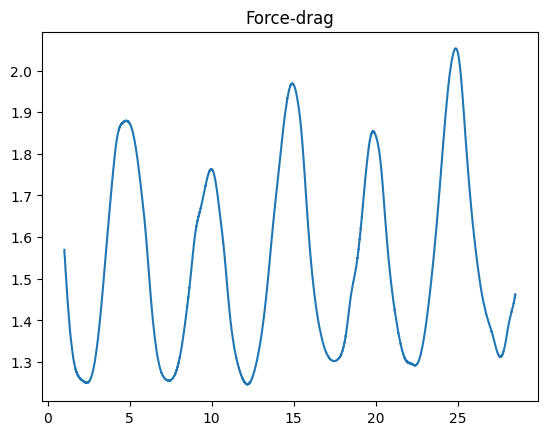

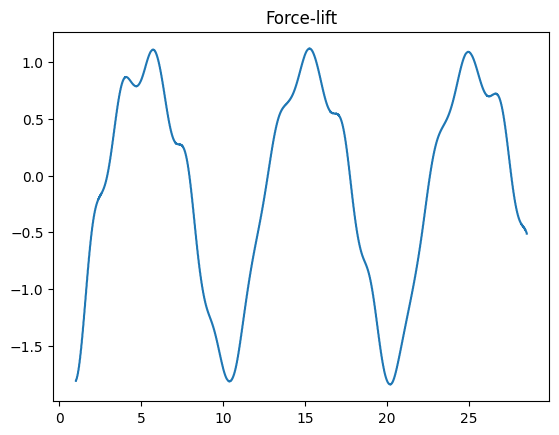

In [17]:
mesh = meshfunc()

time_step(mesh)

As we can see, the cylinder gets compressed proportionally to the cyclical lift force, which is applied opposite to the velocity, as expected. We also notice a decrease in drag force as the cylinder is at higher values of y, which makes sense, since this is where the cylinder is the most compressed, leading to a smaller surface area.

Next, we modify the equations of motion in order to make the cylinder compress while staying in place:

Time t = 0.03285506167650246


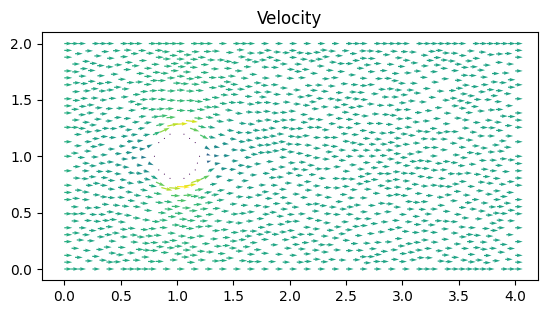

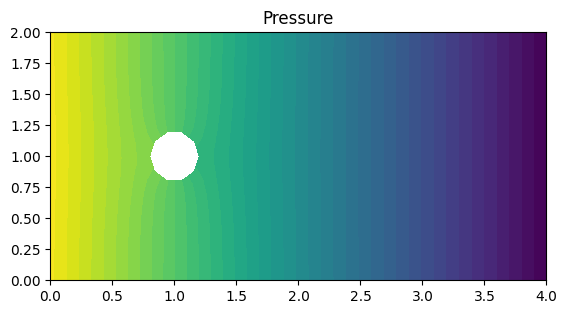

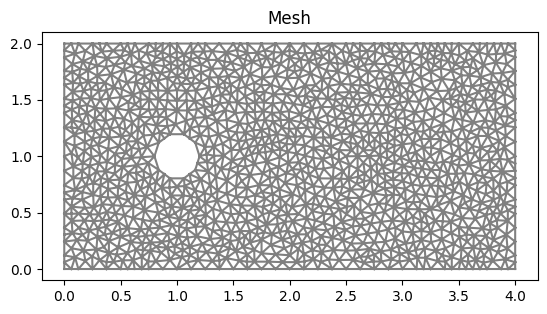

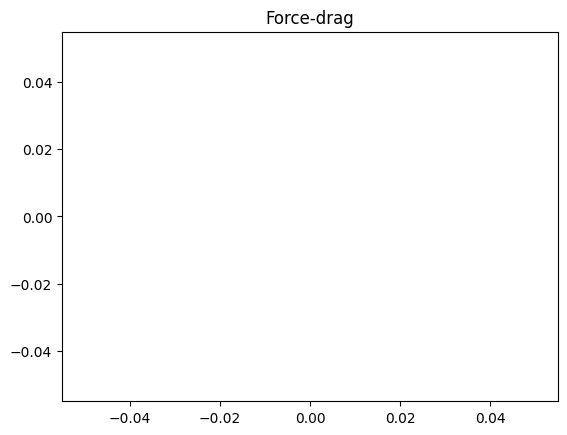

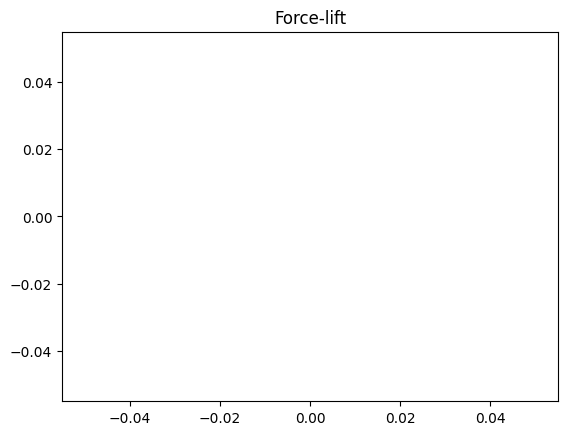

Time t = 1.5113328371191124


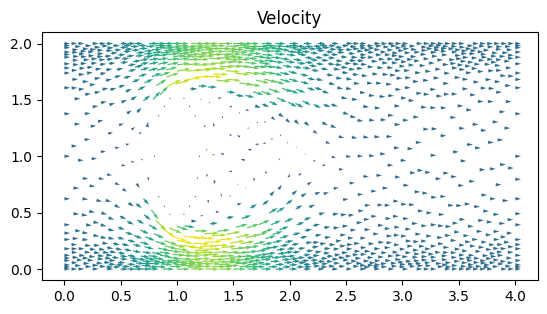

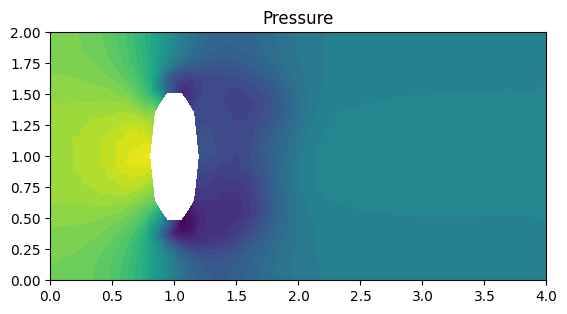

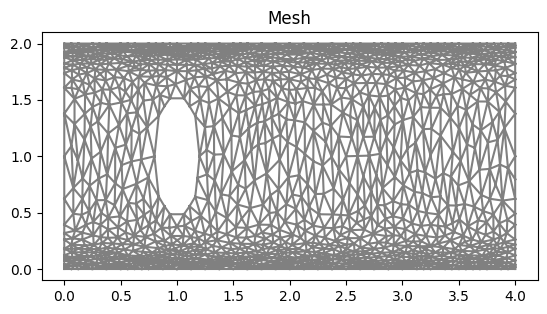

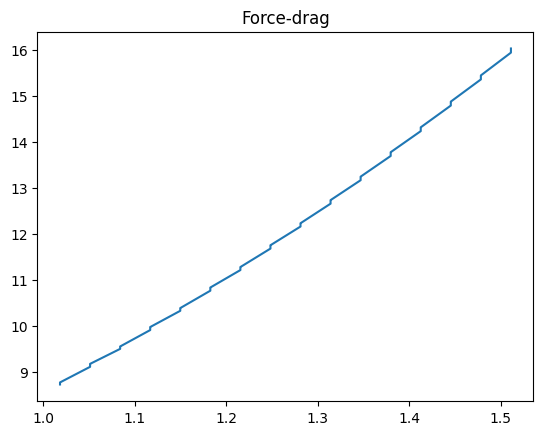

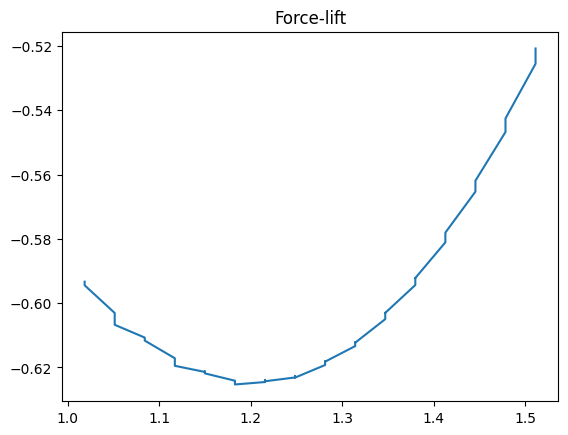

Time t = 3.022665674238231


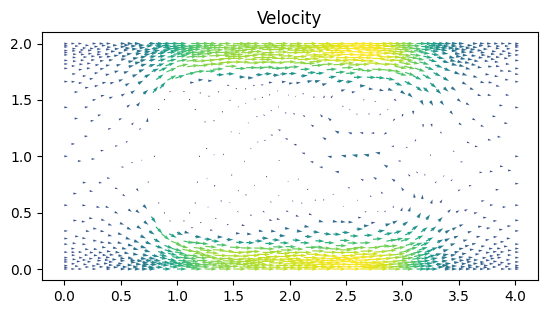

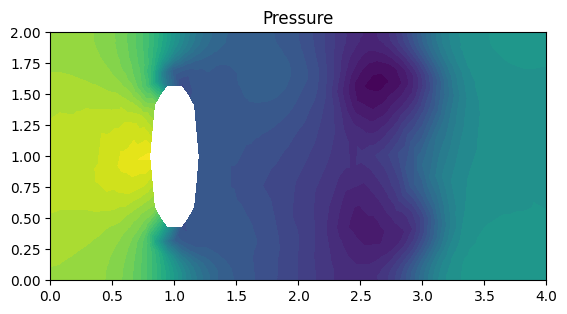

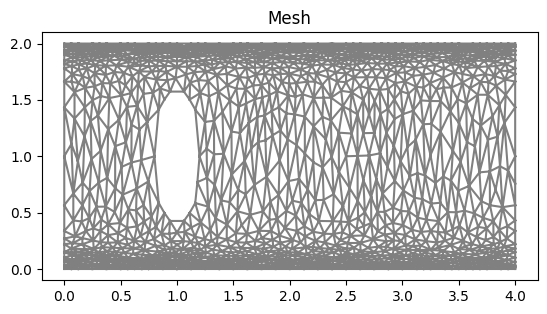

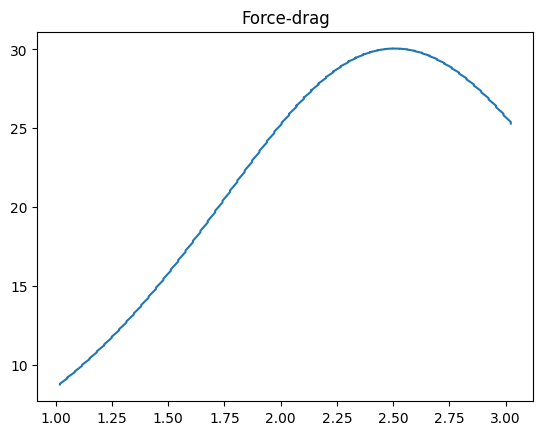

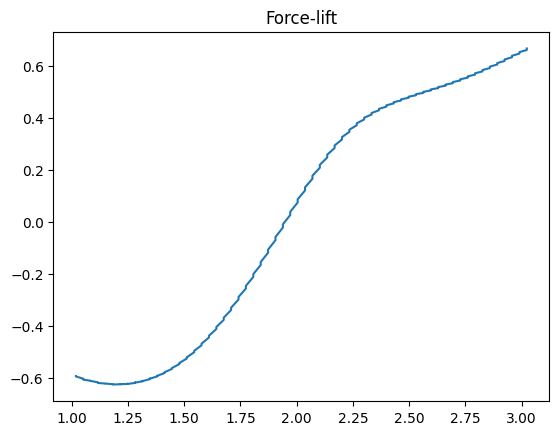

Time t = 4.50114344968085


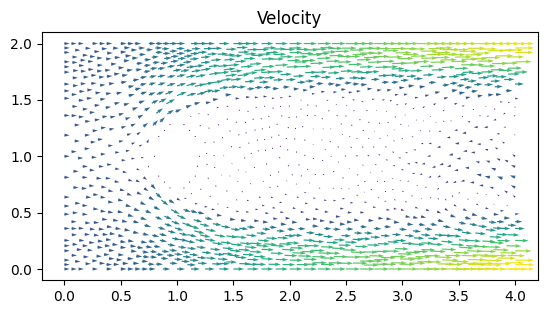

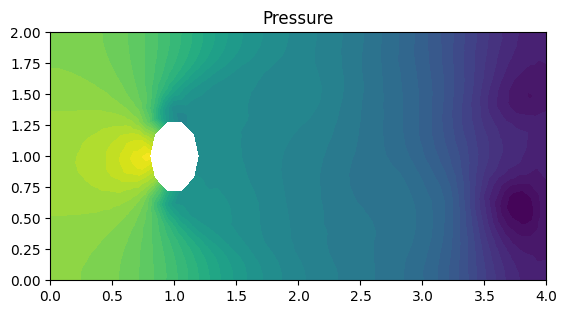

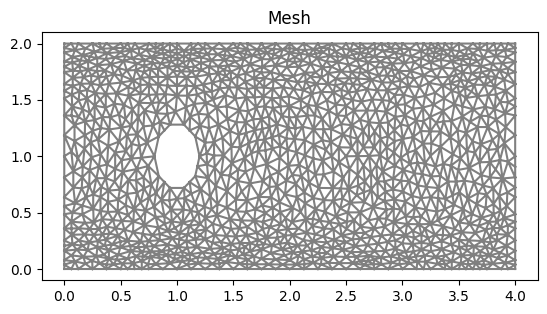

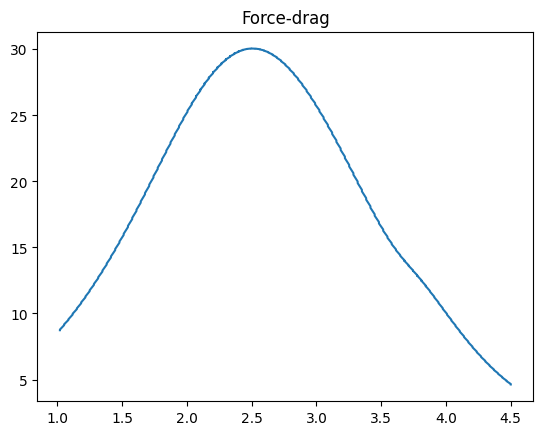

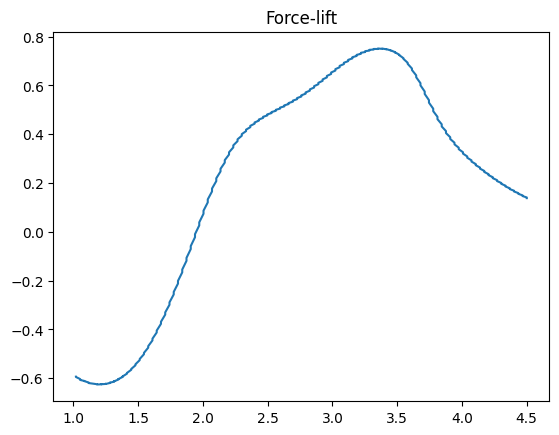

Time t = 6.012476286799972


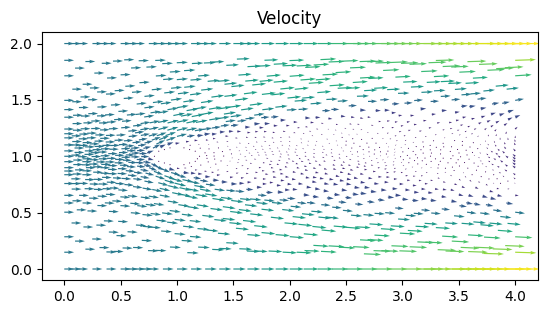

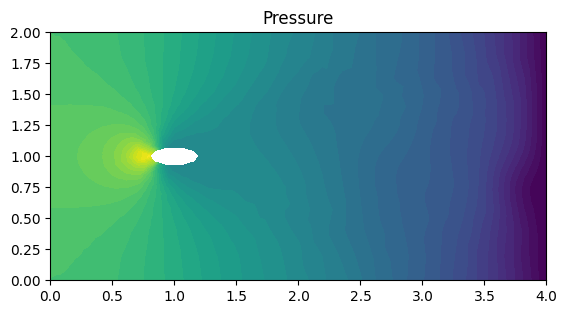

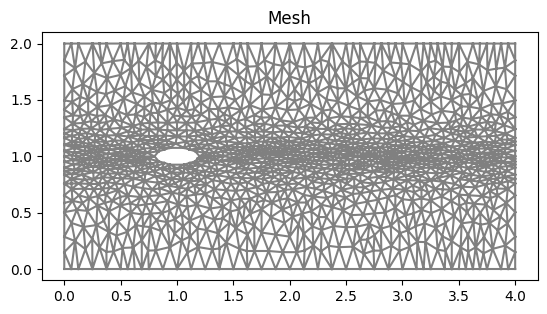

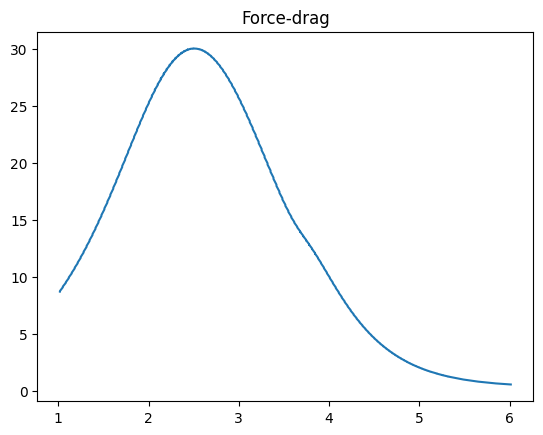

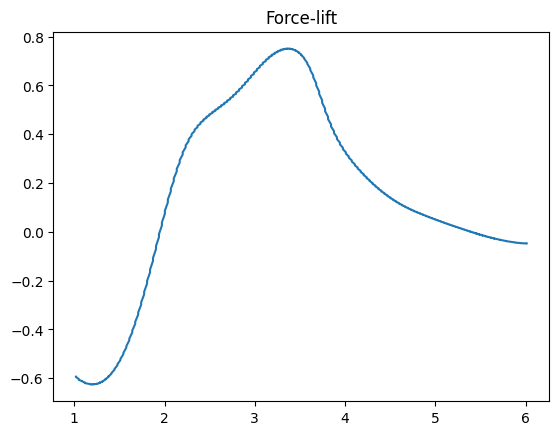

Time t = 7.523809123919094


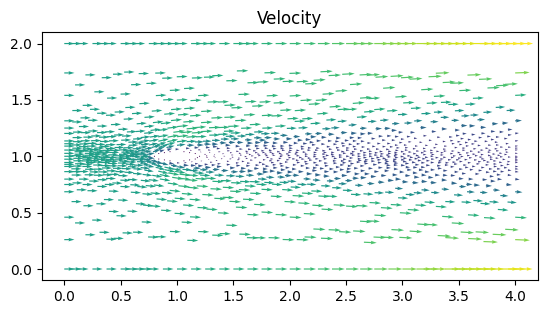

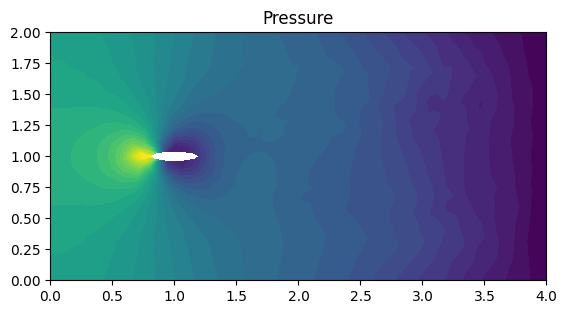

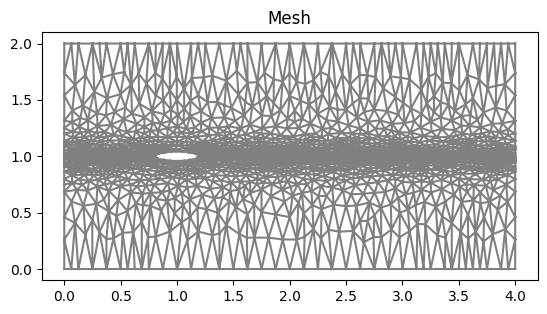

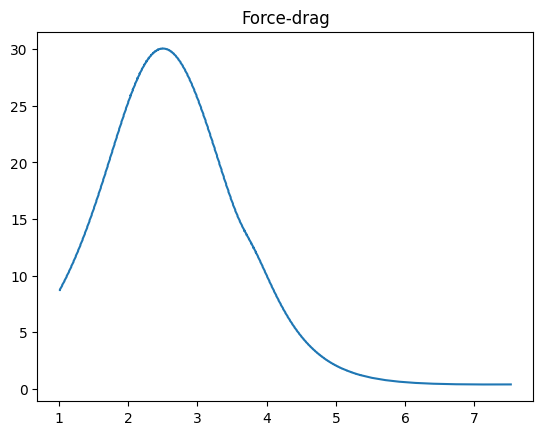

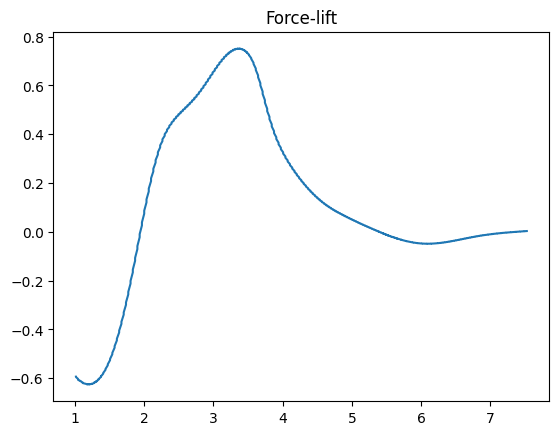

Time t = 9.002286899361685


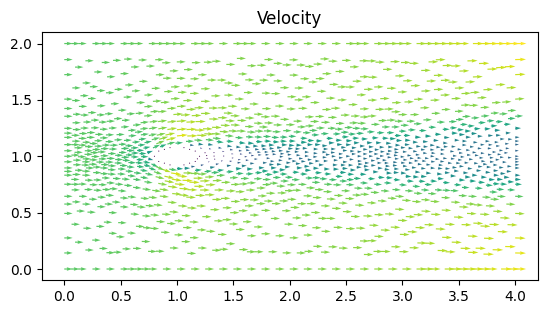

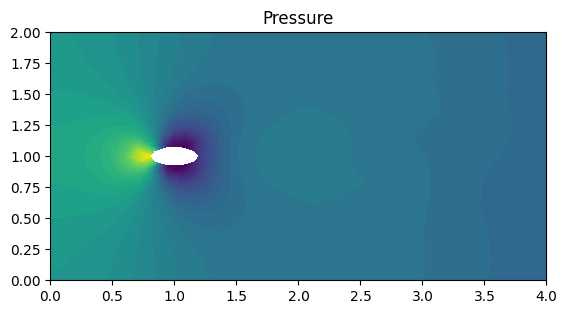

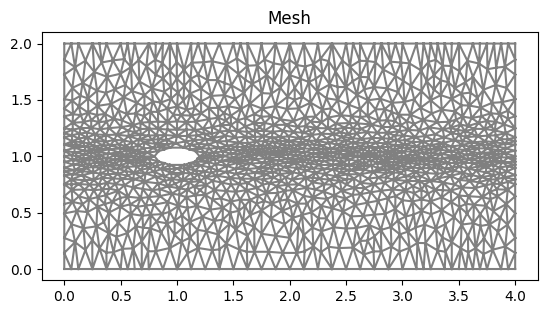

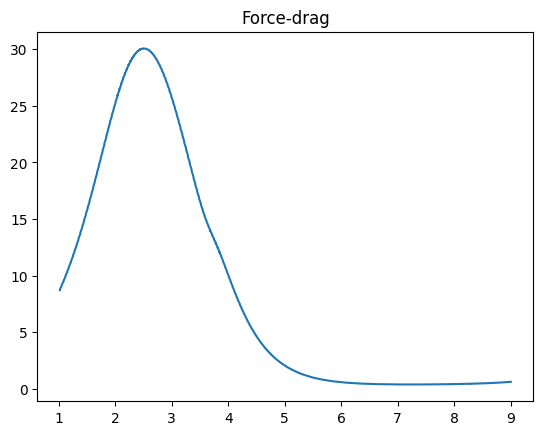

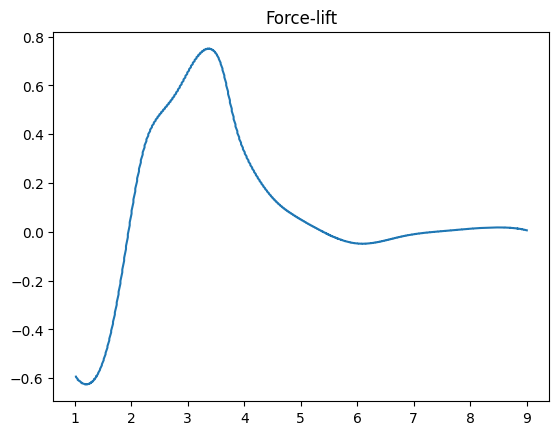

Time t = 10.513619736480766


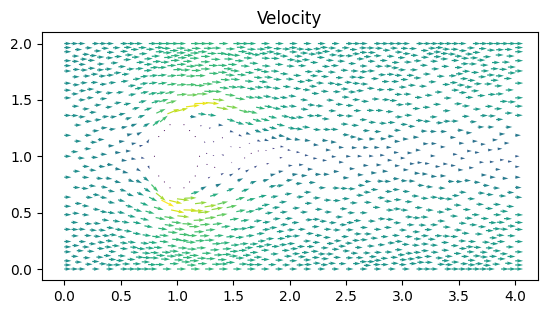

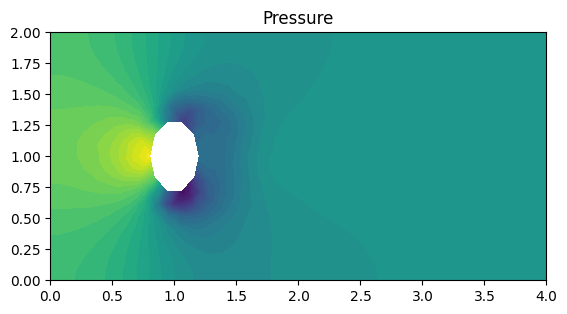

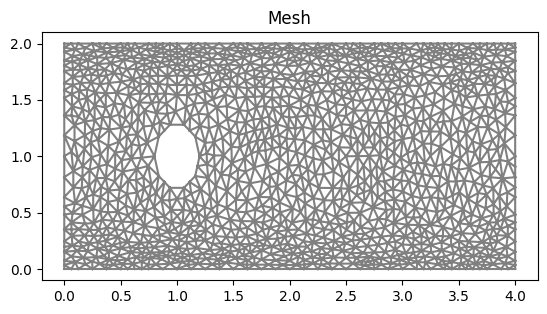

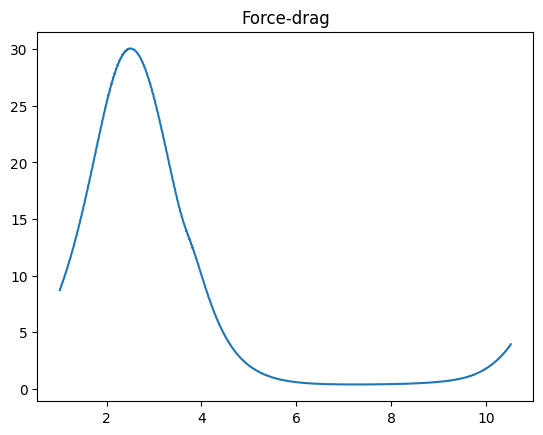

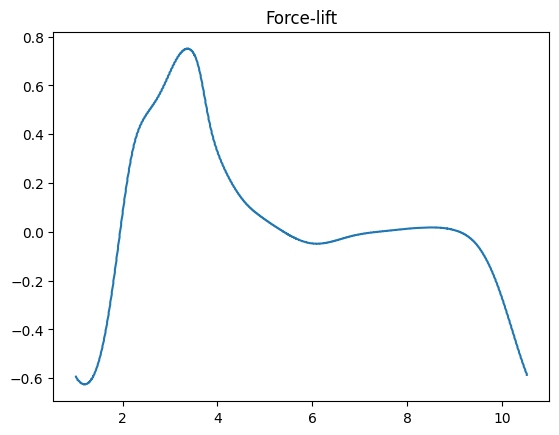

Time t = 12.024952573599847


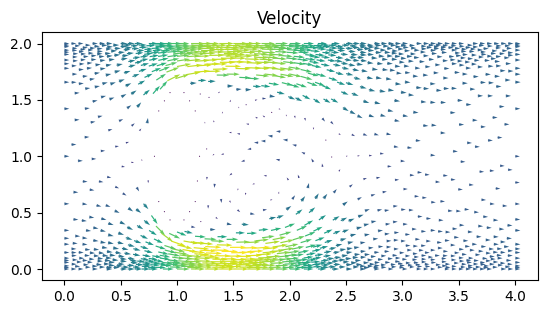

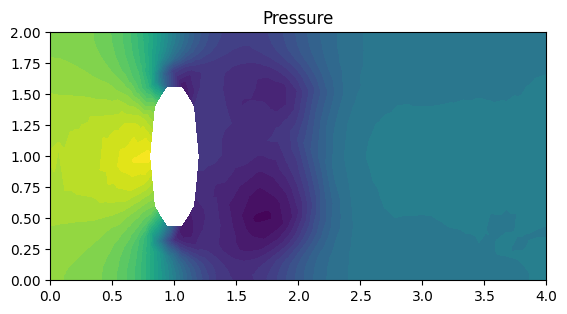

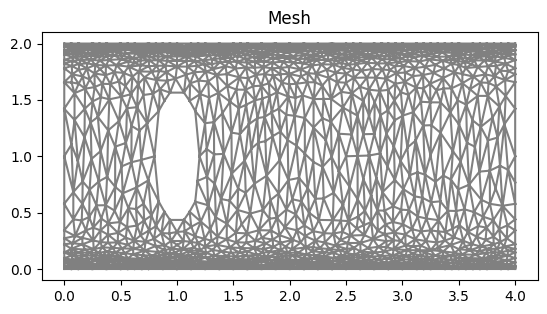

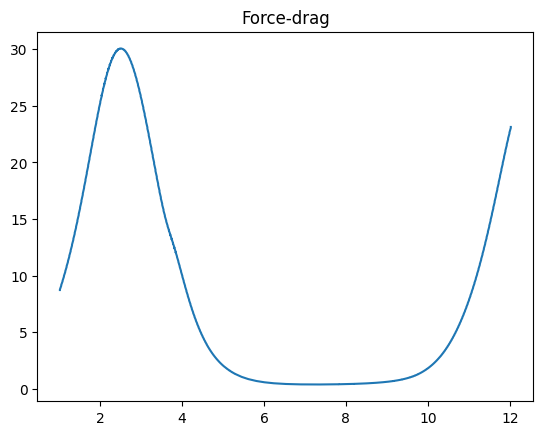

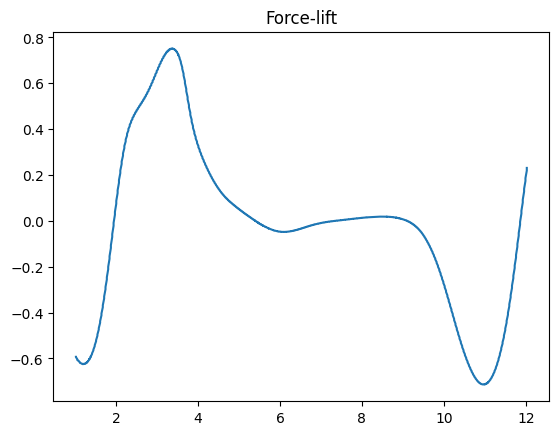

Time t = 13.503430349042427


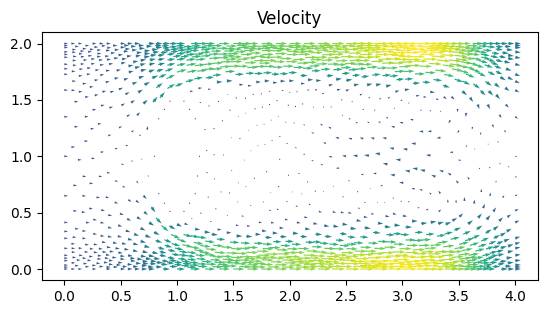

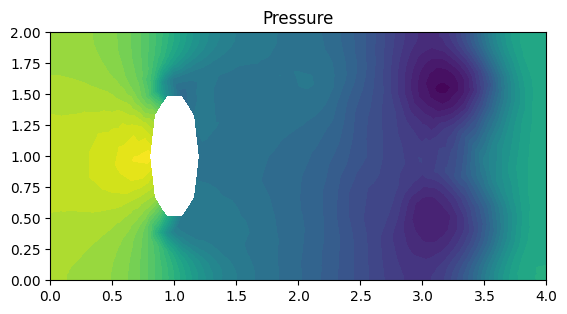

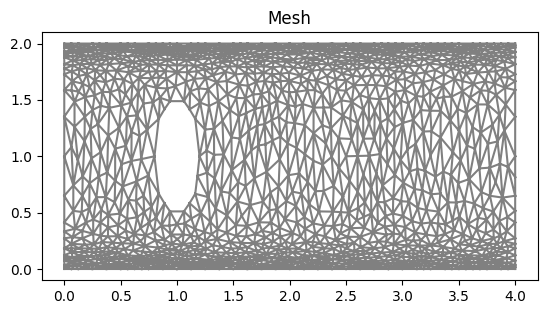

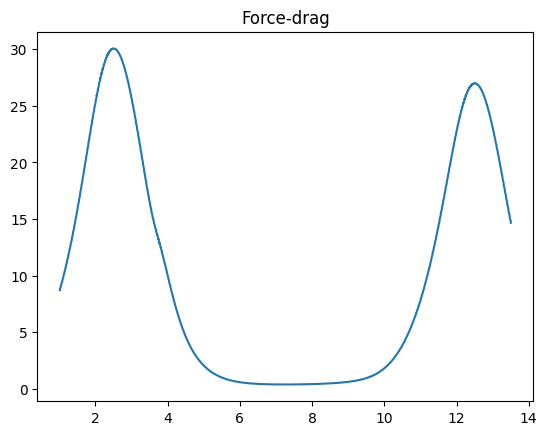

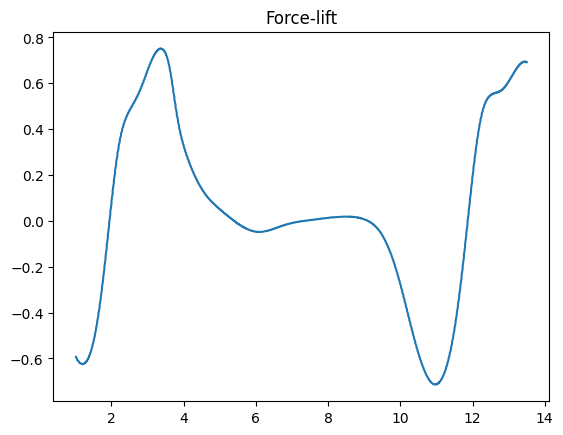

Time t = 15.014763186161508


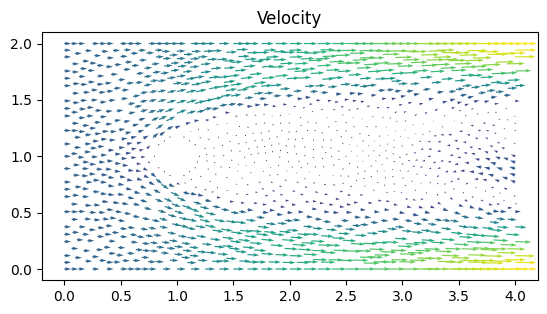

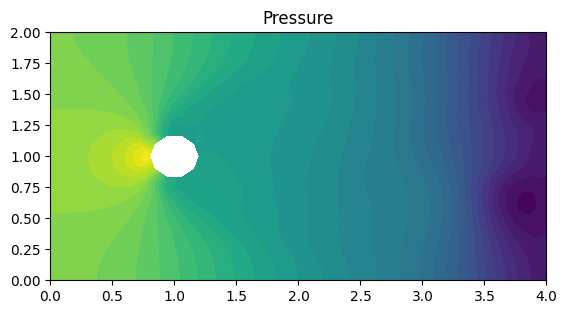

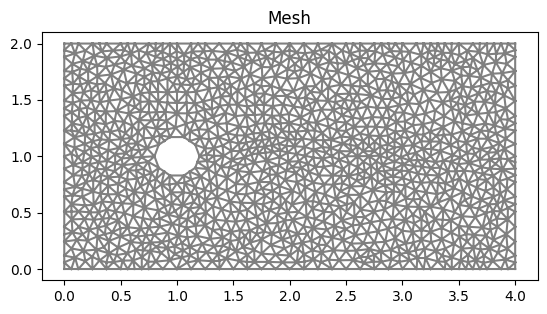

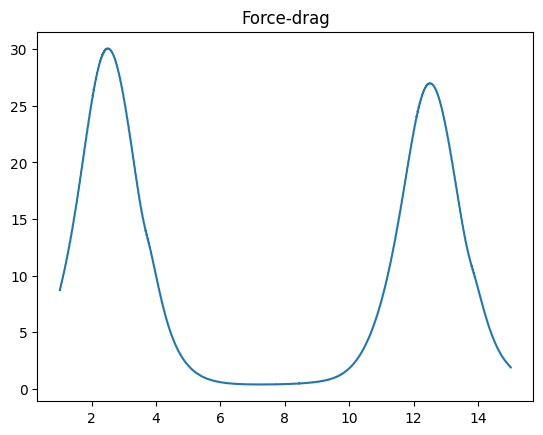

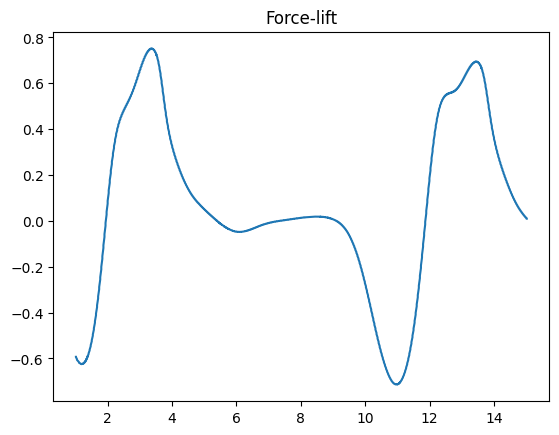

Time t = 16.52609602328062


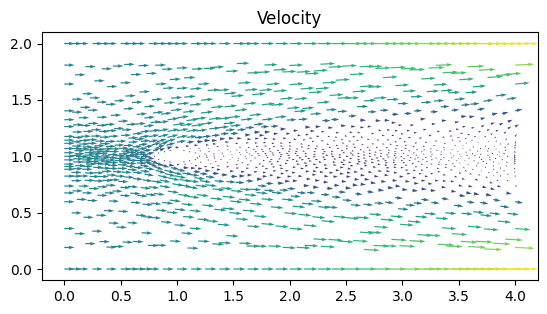

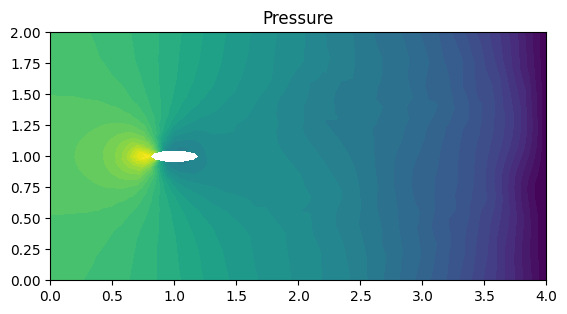

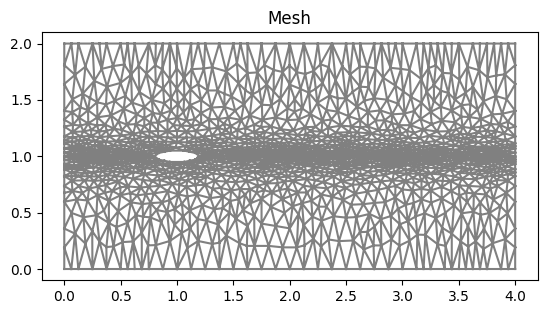

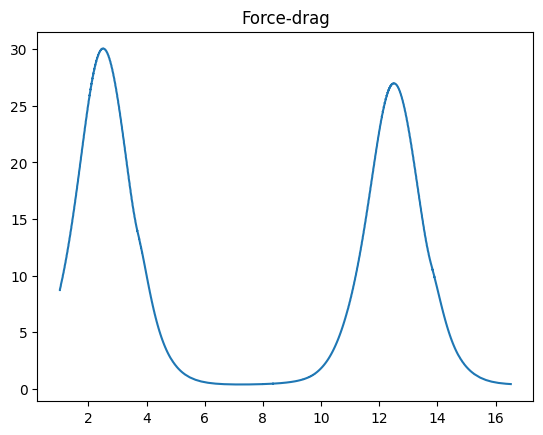

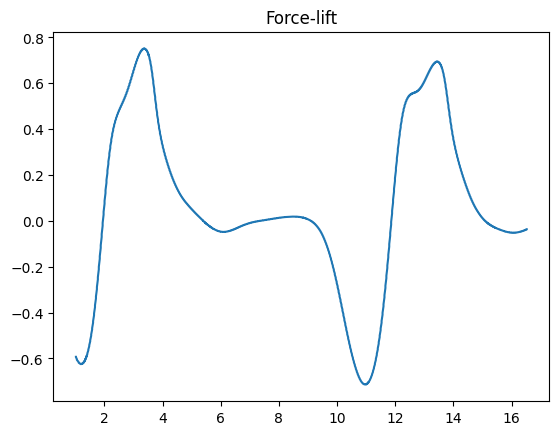

Time t = 18.00457379872328


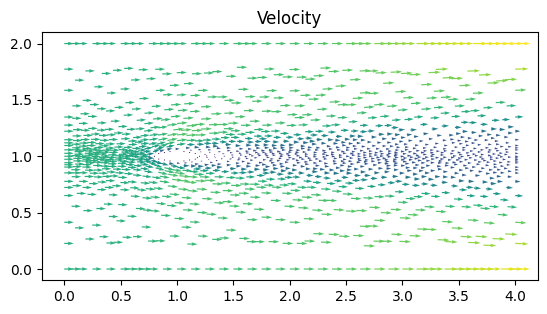

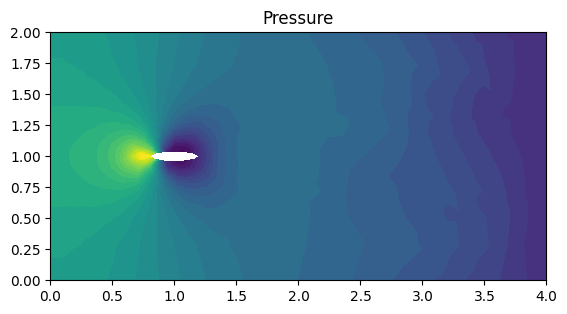

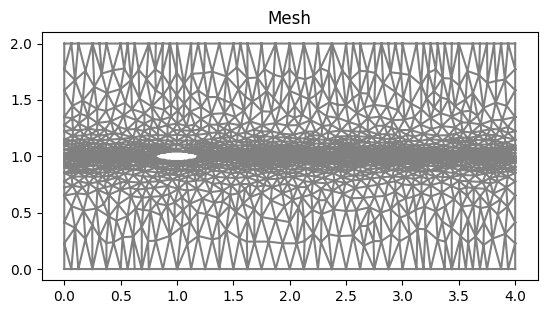

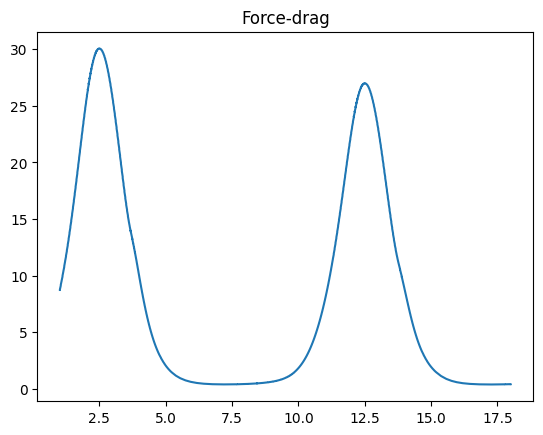

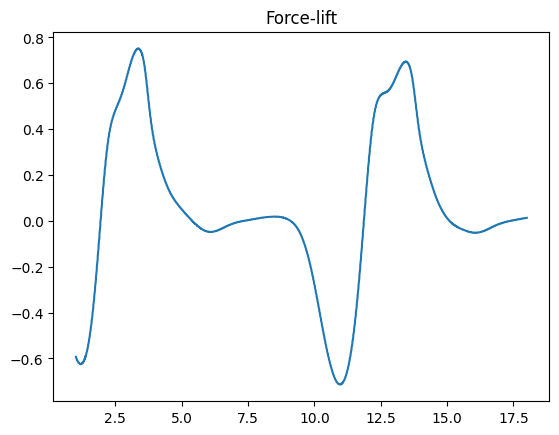

Time t = 19.51590663584244


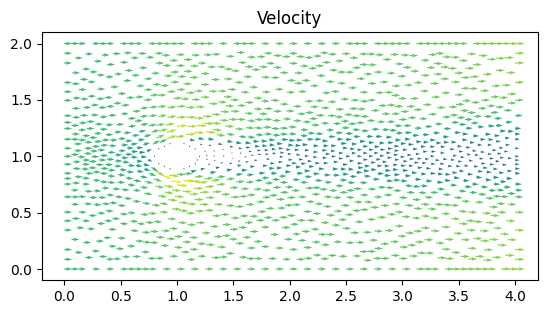

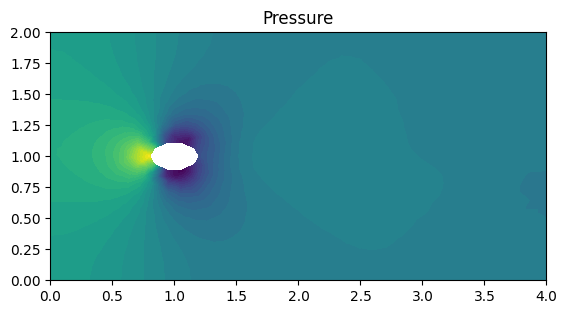

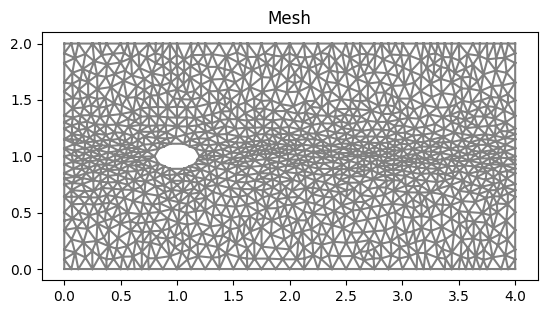

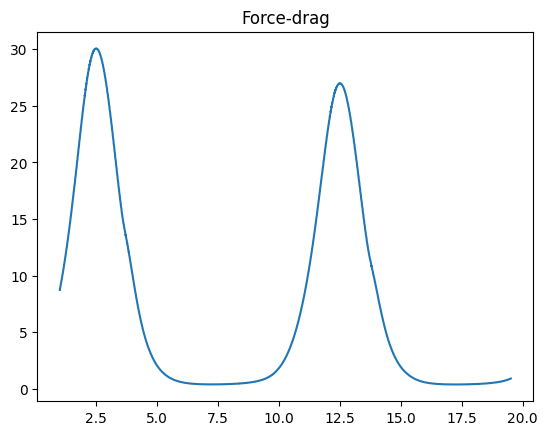

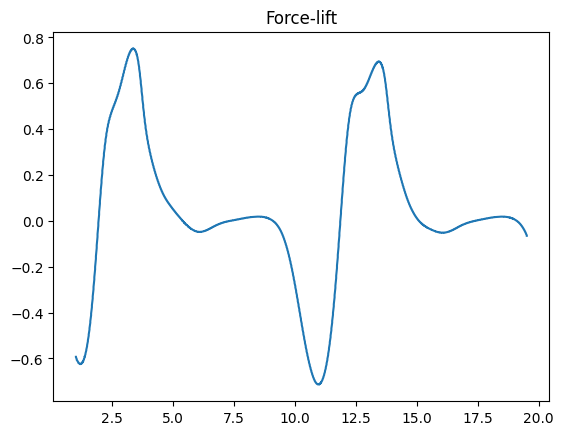

Time t = 21.027239472961604


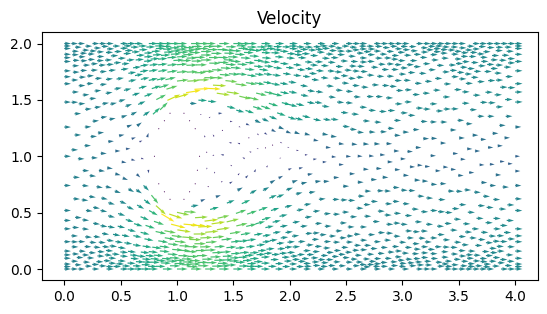

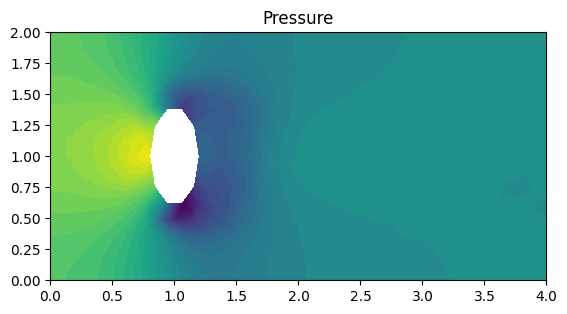

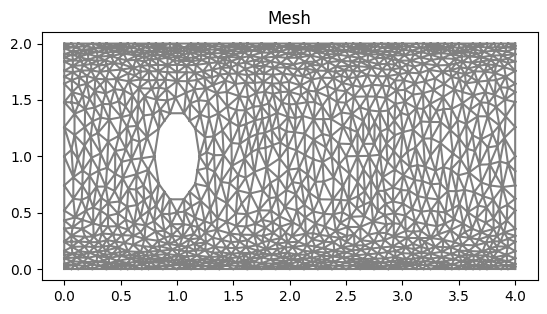

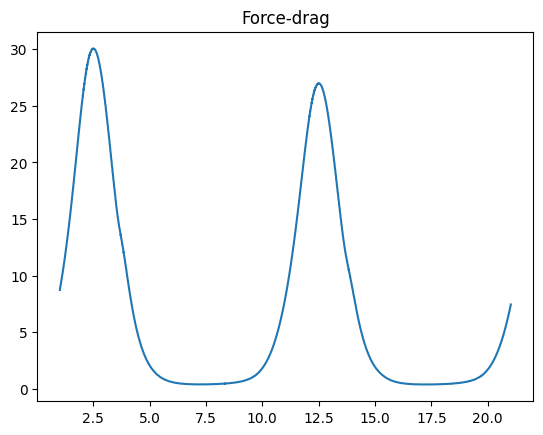

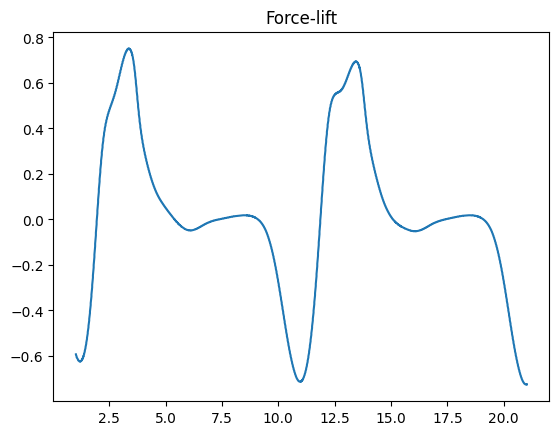

Time t = 22.505717248404263


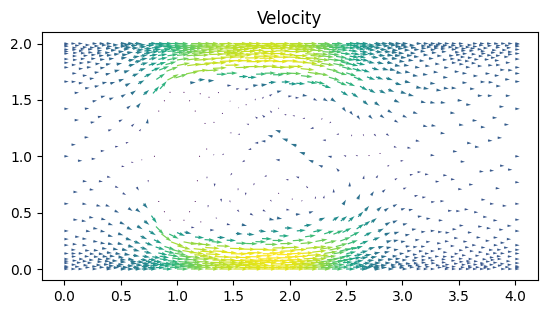

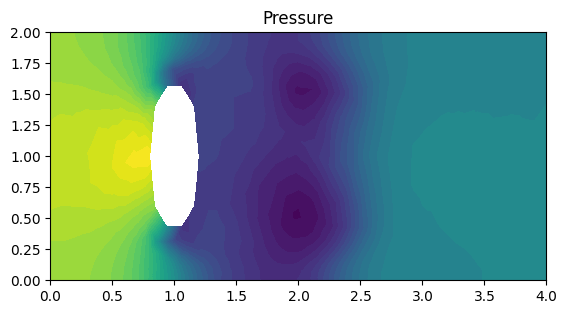

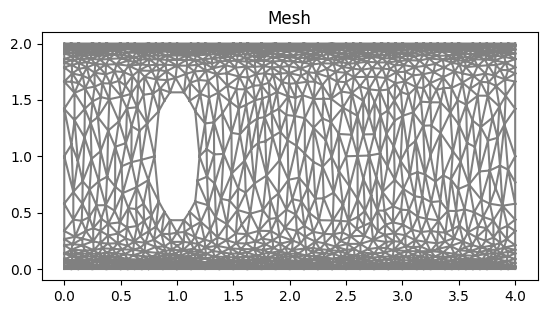

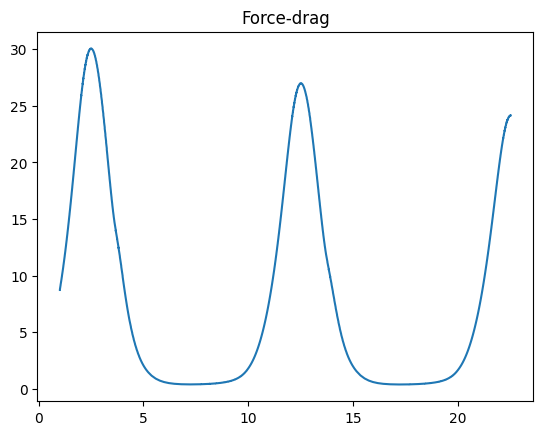

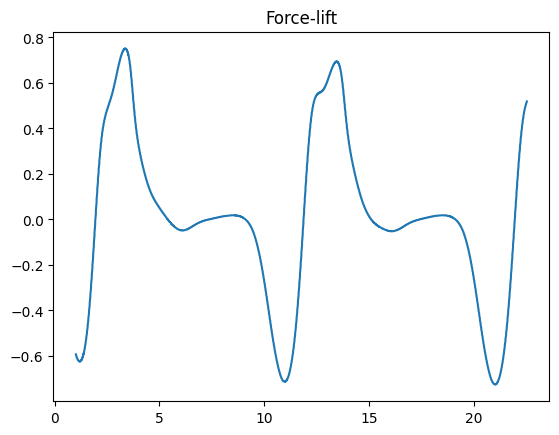

Time t = 24.017050085523426


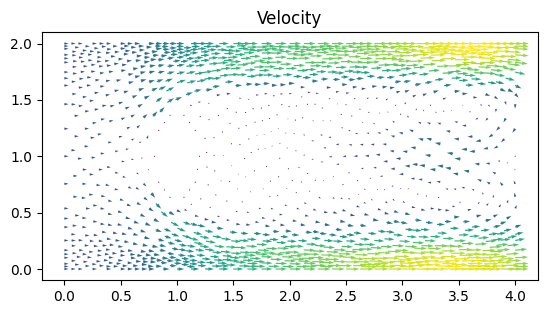

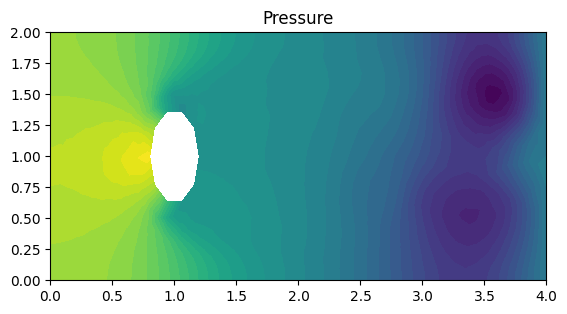

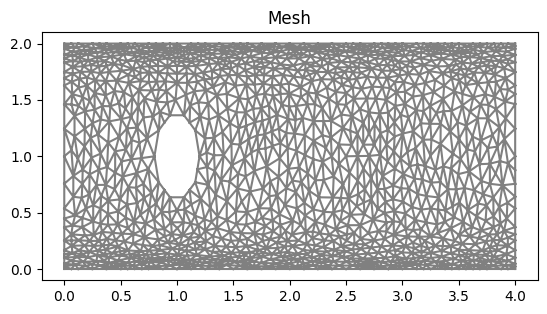

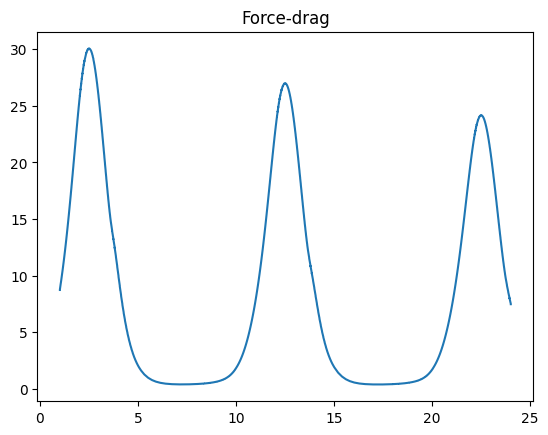

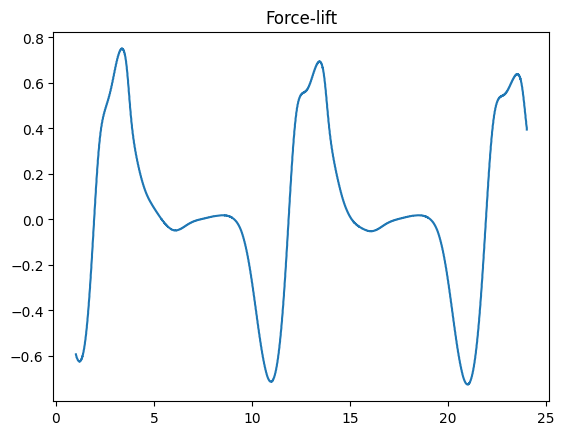

Time t = 25.52838292264259


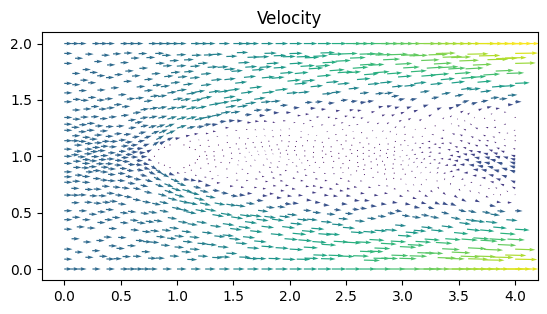

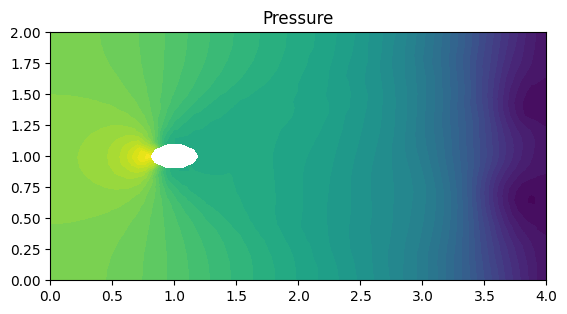

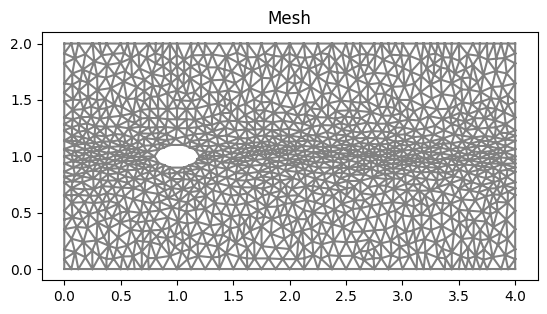

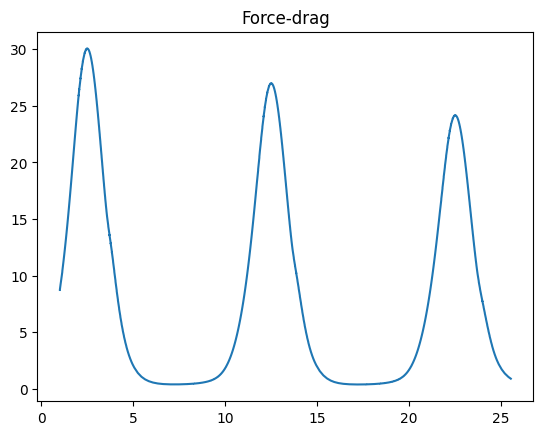

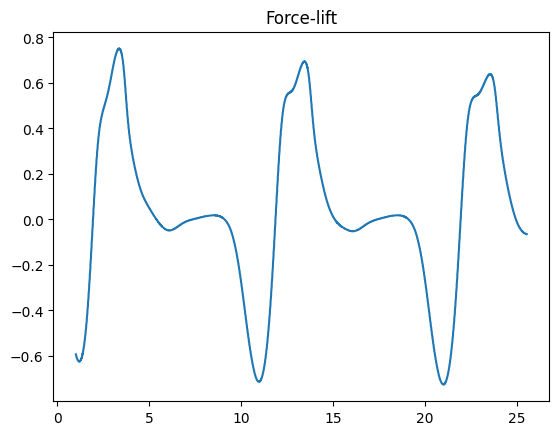

Time t = 27.006860698085248


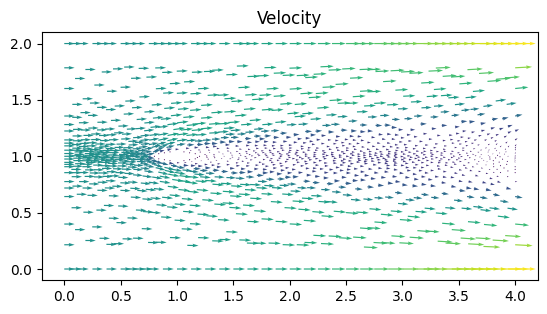

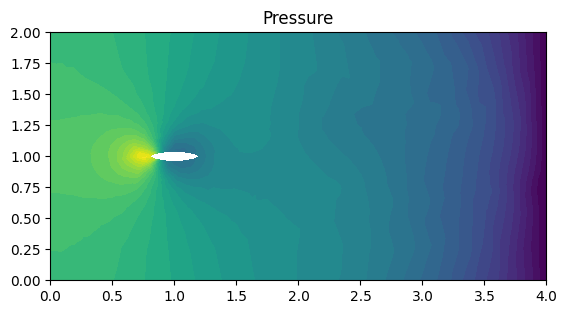

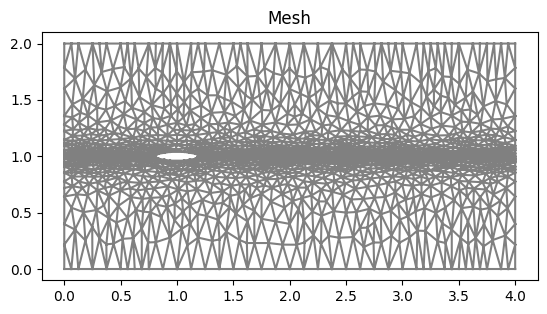

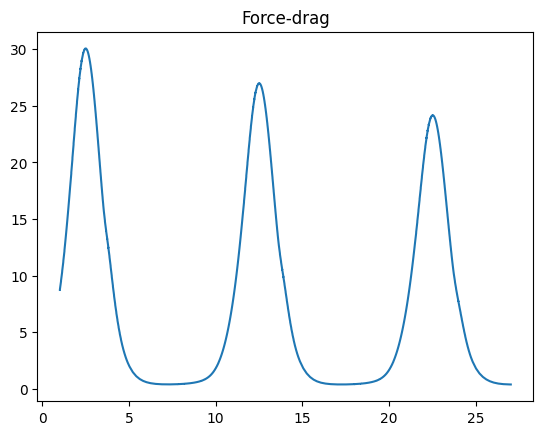

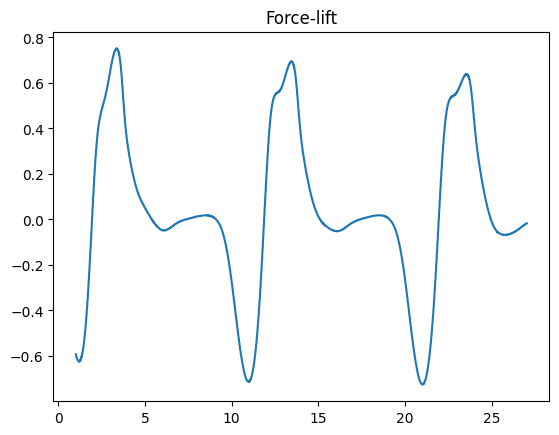

Time t = 28.51819353520441


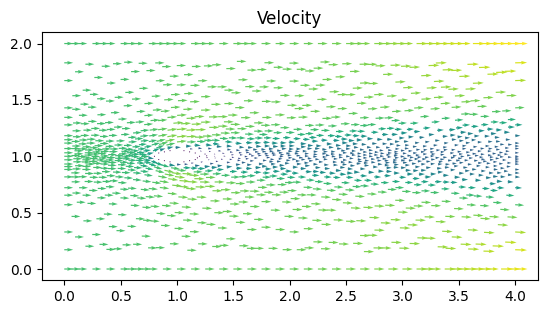

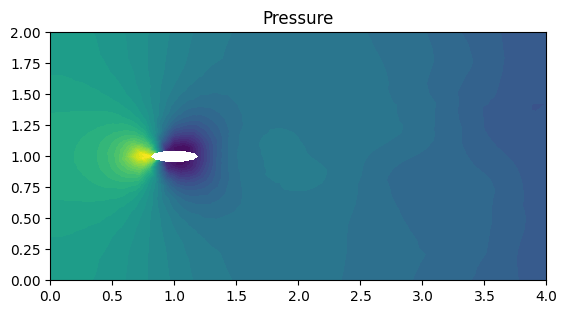

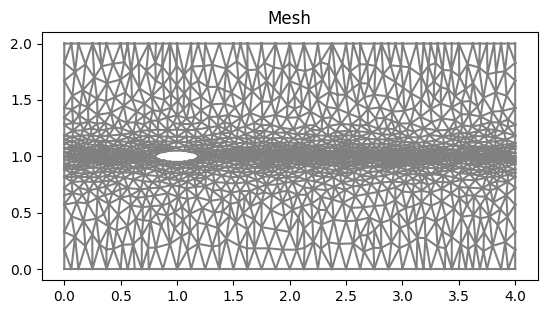

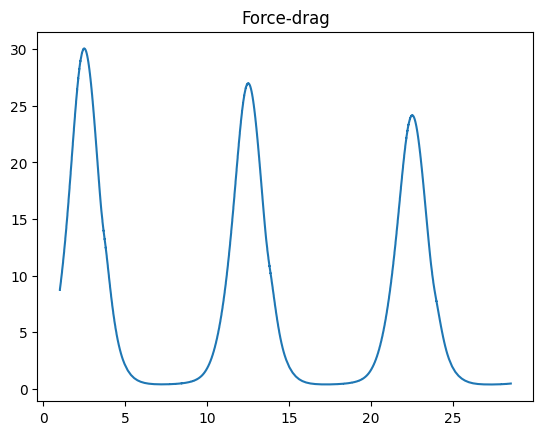

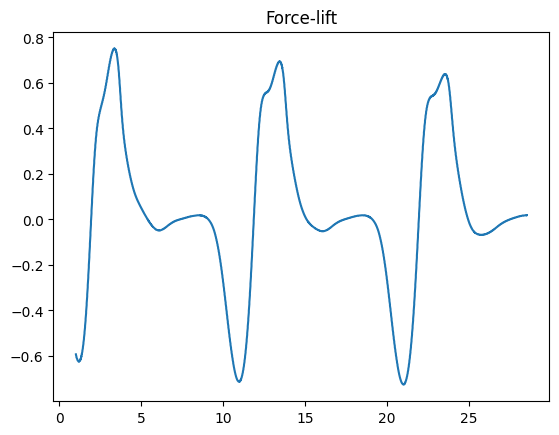

In [18]:
mesh = meshfunc()

time_step(mesh, still = True)

As we can see, the cylinder gets "squished" and "pulled", and the drag force correspondingly reaches much lower values during the times when the cylinder is compressed, and higher values when it is stretched out. The lift force takes in a somewhat more complex pattern, seemingly being stronger while the cylinder is expanding or contracting.

# **Discussion**

Through our results, we observed that both the lift and drag forces shifted as the cylinder deformed. The drag force was most sensitive to the contraction and compression of the cylinder, while the lift force was seemingly more affected by the velocity as well as the rate of change in shape of the cylinder along the y-direction, which is a somewhat expected result.